# **Interpretable Leaf Vein Analysis Using Classical Machine Vision From Image Enhancement to Feature-Based Classification**
### **ENGI9804 Image Processing and Applications**

---

### **Prepared By**

**Group 11 - Sajedabanu Patel and Annur Anika**

Master of Science in Computer Science  
Memorial University of Newfoundland

---

### **Project Overview**

This project presents a complete classical machine vision pipeline for automatic leaf vein extraction and quantitative analysis using grayscale leaf images. The proposed workflow integrates image preprocessing, enhancement, segmentation, morphological analysis, skeletonization, handcrafted feature extraction, statistical analysis, dimensionality reduction, unsupervised clustering, and supervised machine learning validation.

The pipeline was evaluated on a dataset of **900 leaf images**, demonstrating robust feature extraction and classification performance while maintaining a fully interpretable image-processing workflow.

---

### **Software Environment**

- Python 3
- OpenCV
- NumPy
- Pandas
- Matplotlib
- Scikit-image
- Scikit-learn

---

### **Project Pipeline**

```
Input Leaf Image
        │
        ▼
Image Standardization
        │
        ▼
Noise Reduction
        │
        ▼
Contrast Enhancement
        │
        ▼
Leaf Vein Segmentation
        │
        ▼
Morphological Refinement
        │
        ▼
Skeletonization
        │
        ▼
Vein Network Analysis
        │
        ▼
Feature Extraction
        │
        ▼
Statistical Analysis
        │
        ▼
Principal Component Analysis
        │
        ▼
K-Means Clustering
        │
        ▼
Random Forest Validation
```

---

**Project Status:** Completed

# Project Overview

## Objective

The objective of this project is to develop a robust and fully automated classical machine vision framework for extracting and analysing leaf vein structures from grayscale leaf images. The proposed pipeline combines image preprocessing, segmentation, morphological analysis, and machine learning techniques to quantify the structural characteristics of leaf venation.

---

## Dataset

- **Dataset:** CHAMBASA Leaf Dataset
- **Total Images:** 900 grayscale leaf images
- **Image Type:** High-resolution grayscale images
- **Application:** Leaf vein morphology analysis and feature extraction

---

## Project Workflow

The project is divided into eleven sequential phases:

| Phase | Description |
|-------|-------------|
| Phase 0 | Project Setup |
| Phase 1 | Image Standardization |
| Phase 2 | Noise Reduction |
| Phase 3 | Contrast Enhancement |
| Phase 4 | Leaf Vein Segmentation |
| Phase 5 | Skeletonization and Vein Network Analysis |
| Phase 6 | Feature Extraction |
| Phase 7 | Batch Processing of the Complete Dataset |
| Phase 8 | Statistical Analysis of Extracted Features |
| Phase 9 | Principal Component Analysis (PCA) |
| Phase 10 | K-Means Clustering |
| Phase 11 | Machine Learning Validation |

---

## Expected Outputs

At the completion of the project, the following outputs are generated:

- Standardized leaf images
- Noise-reduced images
- Enhanced leaf images
- Binary vein segmentation masks
- Skeletonized vein networks
- Refined vein network visualizations
- Extracted feature tables
- Statistical summaries
- Correlation matrices
- PCA visualizations
- K-Means clustering results
- Random Forest classification results
- Feature importance analysis

---

## Expected Deliverables

- Fully reproducible Python implementation
- Quantitative evaluation of extracted vein features
- Publication-quality figures and tables
- Final technical report
- Presentation slides

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# ==========================================================
# PHASE 0
# Project Setup
# ==========================================================

"""
Objective
---------
Initialize the project environment by importing the required
libraries, configuring project directories, defining reusable
utility functions, and preparing a consistent workspace for
the complete leaf vein analysis pipeline.
"""

# ==========================================================
# Import Required Libraries
# ==========================================================

import os
import time
import warnings

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path

from skimage.morphology import skeletonize
from skimage.metrics import (
    peak_signal_noise_ratio as psnr,
    structural_similarity as ssim
)

warnings.filterwarnings("ignore")

# ==========================================================
# Project Configuration
# ==========================================================

PROJECT_NAME = "Leaf Vein Feature Extraction and Analysis"

IMAGE_PATH = "/content/drive/MyDrive/ENGI 9804_Project/WAY01-CSP28007-808-SHADE-L1L-CLAHE.jpg"

DATASET_PATH = r"/content/drive/MyDrive/CHAMBASA leaves"

IMAGE_SIZE = (512, 512)

RANDOM_STATE = 42

# ==========================================================
# Output Directories
# ==========================================================

RESULTS_DIR = "/content/drive/MyDrive/ENGI 9804_Project/Results"

FIGURES_DIR = os.path.join(RESULTS_DIR, "Figures")

TABLES_DIR = os.path.join(RESULTS_DIR, "Tables")

IMAGES_DIR = os.path.join(RESULTS_DIR, "Processed_Images")

MODELS_DIR = os.path.join(RESULTS_DIR, "Models")

DATASET_RESULTS_DIR = os.path.join(RESULTS_DIR, "Dataset")

OUTPUT_DIRECTORIES = [

    RESULTS_DIR,

    FIGURES_DIR,

    TABLES_DIR,

    IMAGES_DIR,

    MODELS_DIR,

    DATASET_RESULTS_DIR

]

for directory in OUTPUT_DIRECTORIES:
    os.makedirs(directory, exist_ok=True)

# ==========================================================
# Matplotlib Configuration
# ==========================================================

plt.rcParams["figure.figsize"] = (8,6)

plt.rcParams["figure.dpi"] = 150

plt.rcParams["font.size"] = 11

plt.rcParams["axes.titlesize"] = 14

plt.rcParams["axes.labelsize"] = 12

# ==========================================================
# Utility Functions
# ==========================================================

def print_header(title):

    print("\n" + "="*70)
    print(title.upper())
    print("="*70)


def print_footer(message="Phase completed successfully."):

    print("\n" + "-"*70)
    print(message)
    print("-"*70)


def load_image():

    image = cv2.imread(
        IMAGE_PATH,
        cv2.IMREAD_GRAYSCALE
    )

    if image is None:

        raise FileNotFoundError(
            f"Unable to locate image:\n{IMAGE_PATH}"
        )

    return image


def resize_image(image):

    return cv2.resize(
        image,
        IMAGE_SIZE,
        interpolation=cv2.INTER_AREA
    )


def normalize_image(image):

    image = cv2.normalize(
        image,
        None,
        0,
        255,
        cv2.NORM_MINMAX
    )

    return image.astype(np.uint8)


def save_image(image, filename):

    path = os.path.join(
        IMAGES_DIR,
        filename
    )

    cv2.imwrite(path, image)

    return path


def save_figure(filename):

    plt.savefig(
        os.path.join(
            FIGURES_DIR,
            filename
        ),
        dpi=300,
        bbox_inches="tight"
    )


def save_table(df, filename):

    path = os.path.join(
        TABLES_DIR,
        filename
    )

    df.to_csv(
        path,
        index=False
    )

    return path


def execution_time(start_time):

    return round(
        time.time() - start_time,
        3
    )

def display_dataframe(df, title=None):

    if title:
        print(f"\n{title}")

    print(df.to_string(index=False))

# ==========================================================
# Project Information
# ==========================================================

print_header("Project Initialization")

print(f"Project Name      : {PROJECT_NAME}")
print(f"Image Resolution  : {IMAGE_SIZE[0]} × {IMAGE_SIZE[1]}")
print(f"Random Seed       : {RANDOM_STATE}")

print("\nOutput Directories")

for directory in OUTPUT_DIRECTORIES:
    print(f"✓ {directory}")

print_footer("Project environment initialized successfully.")


PROJECT INITIALIZATION
Project Name      : Leaf Vein Feature Extraction and Analysis
Image Resolution  : 512 × 512
Random Seed       : 42

Output Directories
✓ /content/drive/MyDrive/ENGI 9804_Project/Results
✓ /content/drive/MyDrive/ENGI 9804_Project/Results/Figures
✓ /content/drive/MyDrive/ENGI 9804_Project/Results/Tables
✓ /content/drive/MyDrive/ENGI 9804_Project/Results/Processed_Images
✓ /content/drive/MyDrive/ENGI 9804_Project/Results/Models
✓ /content/drive/MyDrive/ENGI 9804_Project/Results/Dataset

----------------------------------------------------------------------
Project environment initialized successfully.
----------------------------------------------------------------------


# Phase 1 – Image Standardization and Initial Inspection

## Objective

The objective of this phase is to standardize the input leaf image before further processing. A consistent image size and intensity range ensure that subsequent image processing algorithms produce reliable and reproducible results.

---

### Input

- Original grayscale leaf image

### Processing Steps

- Load the original image
- Resize the image to **512 × 512 pixels**
- Normalize the pixel intensity range to **0–255**
- Compute basic image statistics
- Generate the image histogram

### Output

- Standardized leaf image
- Image histogram
- Image statistics


PHASE 1 - IMAGE STANDARDIZATION

Image Statistics

          Parameter       Value
Original Resolution 1333 × 2000
Standard Resolution   512 × 512
  Minimum Intensity           0
  Maximum Intensity         255
     Mean Intensity      127.04
 Standard Deviation       73.31


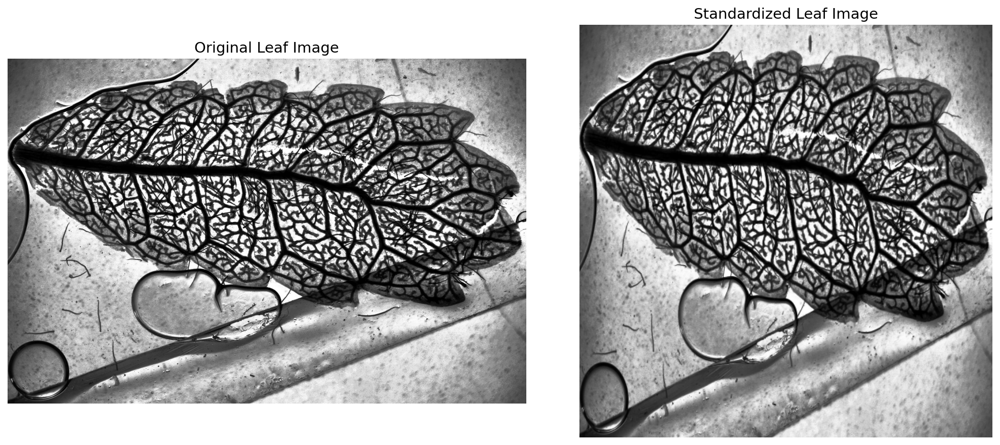

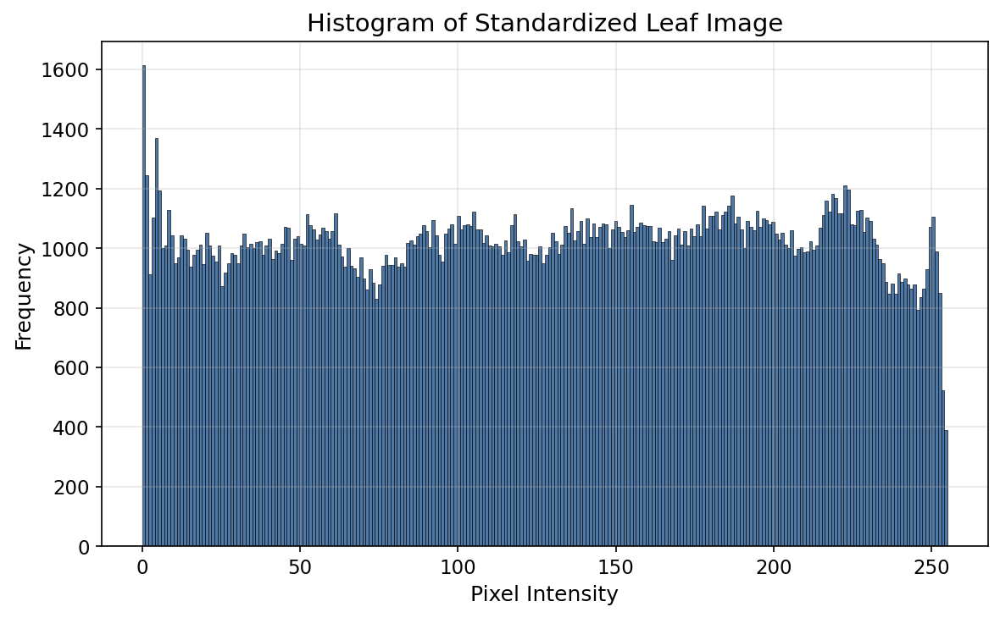



                Item    Result
        Image Loaded       Yes
       Image Resized 512 × 512
Intensity Normalized Completed
 Histogram Generated Completed
Execution Time (sec)     9.891

----------------------------------------------------------------------
Phase 1 completed successfully.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 1
# Image Standardization & Initial Inspection
# ==========================================================

start_time = time.time()

print_header("Phase 1 - Image Standardization")

# ----------------------------------------------------------
# Step 1: Load Image
# ----------------------------------------------------------

original_image = load_image()

# ----------------------------------------------------------
# Step 2: Resize Image
# ----------------------------------------------------------

standardized_image = resize_image(original_image)

# ----------------------------------------------------------
# Step 3: Normalize Intensity
# ----------------------------------------------------------

standardized_image = normalize_image(standardized_image)

# ----------------------------------------------------------
# Step 4: Save Standardized Image
# ----------------------------------------------------------

save_image(
    standardized_image,
    "leaf_standardized.png"
)

# ----------------------------------------------------------
# Step 5: Compute Image Statistics
# ----------------------------------------------------------

image_statistics = pd.DataFrame({

    "Parameter":[
        "Original Resolution",
        "Standard Resolution",
        "Minimum Intensity",
        "Maximum Intensity",
        "Mean Intensity",
        "Standard Deviation"
    ],

    "Value":[
        f"{original_image.shape[0]} × {original_image.shape[1]}",
        f"{standardized_image.shape[0]} × {standardized_image.shape[1]}",
        int(standardized_image.min()),
        int(standardized_image.max()),
        round(float(standardized_image.mean()),2),
        round(float(standardized_image.std()),2)
    ]

})

print("\nImage Statistics\n")
print(image_statistics.to_string(index=False))

save_table(
    image_statistics,
    "table_01_image_statistics.csv"
)

# ----------------------------------------------------------
# Step 6: Display Images
# ----------------------------------------------------------

fig, ax = plt.subplots(1,2, figsize=(14,6))

ax[0].imshow(original_image, cmap="gray")
ax[0].set_title("Original Leaf Image")
ax[0].axis("off")

ax[1].imshow(standardized_image, cmap="gray")
ax[1].set_title("Standardized Leaf Image")
ax[1].axis("off")

plt.tight_layout()

save_figure(
    "figure_01_standardized_image.png"
)

plt.show()

# ----------------------------------------------------------
# Step 7: Histogram
# ----------------------------------------------------------

plt.figure(figsize=(8,5))

plt.hist(

    standardized_image.ravel(),

    bins=256,

    range=(0,255),

    color="#4E79A7",

    edgecolor="black",

    linewidth=0.3

)

plt.title("Histogram of Standardized Leaf Image")

plt.xlabel("Pixel Intensity")

plt.ylabel("Frequency")

plt.grid(alpha=0.3)

plt.tight_layout()

save_figure(
    "figure_02_image_histogram.png"
)

plt.show()

# ----------------------------------------------------------
# Phase Summary
# ----------------------------------------------------------

elapsed = execution_time(start_time)

summary = pd.DataFrame({

    "Item":[
        "Image Loaded",
        "Image Resized",
        "Intensity Normalized",
        "Histogram Generated",
        "Execution Time (sec)"
    ],

    "Result":[
        "Yes",
        "512 × 512",
        "Completed",
        "Completed",
        elapsed
    ]

})

print("\n")
print(summary.to_string(index=False))

print_footer(
    "Phase 1 completed successfully."
)

# Phase 2 – Noise Reduction and Filter Comparison

## Objective

The objective of this phase is to reduce image noise while preserving fine leaf vein structures. Three commonly used smoothing filters are evaluated and compared quantitatively.

---

### Input

- Standardized leaf image

### Processing Steps

- Gaussian filtering
- Median filtering
- Bilateral filtering
- Difference image analysis
- Quantitative comparison using PSNR and SSIM

### Output

- Filter comparison figure
- Difference images
- Quantitative comparison table
- Selected filtered image


PHASE 2 - NOISE REDUCTION

Filter Comparison
   Filter   PSNR   SSIM
 Gaussian 21.376 0.8380
   Median 19.928 0.7677
Bilateral 26.094 0.8257

Selected Filter : Gaussian


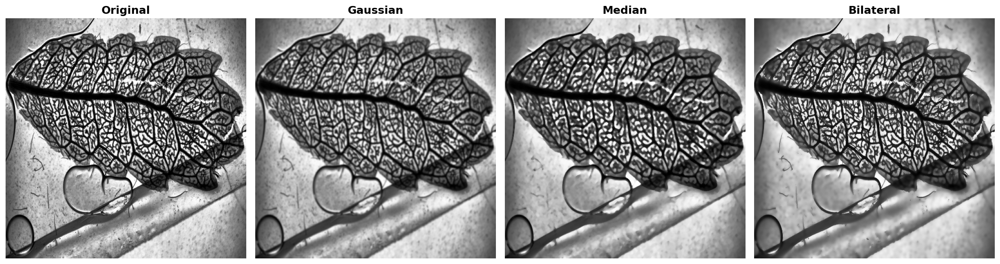

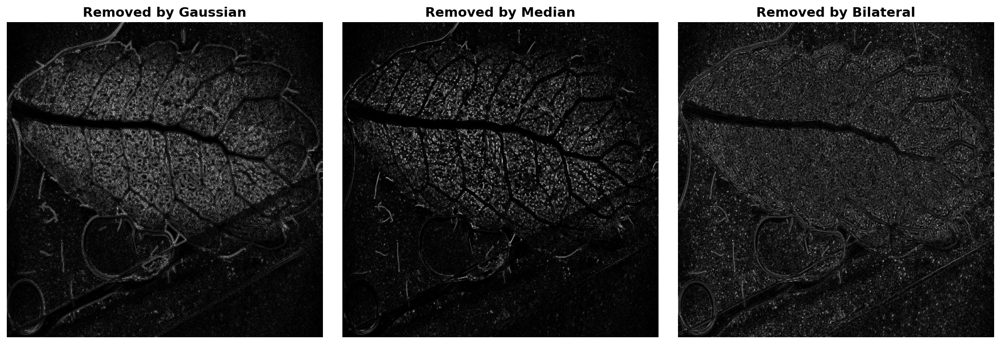


Phase Summary
                Item    Value
         Best Filter Gaussian
                PSNR   21.376
                SSIM    0.838
Execution Time (sec)   17.268

----------------------------------------------------------------------
Phase 2 completed successfully.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 2
# Noise Reduction & Filter Comparison
# ==========================================================

start_time = time.time()

print_header("Phase 2 - Noise Reduction")

# ----------------------------------------------------------
# Load Standardized Image
# ----------------------------------------------------------

standardized_image = cv2.imread(
    os.path.join(IMAGES_DIR, "leaf_standardized.png"),
    cv2.IMREAD_GRAYSCALE
)

if standardized_image is None:
    raise FileNotFoundError(
        "Standardized image not found. Please run Phase 1 first."
    )

# ----------------------------------------------------------
# Apply Filters
# ----------------------------------------------------------

filters = {

    "Gaussian": cv2.GaussianBlur(
        standardized_image,
        (5,5),
        1.2
    ),

    "Median": cv2.medianBlur(
        standardized_image,
        5
    ),

    "Bilateral": cv2.bilateralFilter(
        standardized_image,
        d=9,
        sigmaColor=50,
        sigmaSpace=50
    )

}

# ----------------------------------------------------------
# Compute Metrics
# ----------------------------------------------------------

comparison = []

for name, filtered in filters.items():

    comparison.append({

        "Filter": name,

        "PSNR": round(
            psnr(
                standardized_image,
                filtered,
                data_range=255
            ),
            3
        ),

        "SSIM": round(
            ssim(
                standardized_image,
                filtered,
                data_range=255
            ),
            4
        )

    })

comparison_df = pd.DataFrame(comparison)

display_dataframe(
    comparison_df,
    "Filter Comparison"
)

save_table(
    comparison_df,
    "table_02_filter_comparison.csv"
)

# ----------------------------------------------------------
# Select Best Filter
# ----------------------------------------------------------

best_filter_name = comparison_df.loc[
    comparison_df["SSIM"].idxmax(),
    "Filter"
]

filtered_image = filters[best_filter_name]

save_image(
    filtered_image,
    "leaf_filtered.png"
)

print(f"\nSelected Filter : {best_filter_name}")

# ----------------------------------------------------------
# Difference Images
# ----------------------------------------------------------

difference_images = {

    name: cv2.absdiff(
        standardized_image,
        image
    )

    for name, image in filters.items()

}

# ----------------------------------------------------------
# Figure 3A - Filter Comparison
# ----------------------------------------------------------

fig, ax = plt.subplots(
    1,
    4,
    figsize=(18,5)
)

titles = [
    "Original",
    "Gaussian",
    "Median",
    "Bilateral"
]

images = [
    standardized_image,
    filters["Gaussian"],
    filters["Median"],
    filters["Bilateral"]
]

for i in range(4):

    ax[i].imshow(images[i], cmap="gray")

    ax[i].set_title(
        titles[i],
        fontsize=14,
        fontweight="bold"
    )

    ax[i].axis("off")

plt.tight_layout()

save_figure(
    "figure_03a_filter_comparison.png"
)

plt.show()

# ----------------------------------------------------------
# Figure 3B - Difference Images
# ----------------------------------------------------------

fig, ax = plt.subplots(
    1,
    3,
    figsize=(15,5)
)

for i, name in enumerate(filters.keys()):

    ax[i].imshow(
        difference_images[name],
        cmap="gray"
    )

    ax[i].set_title(
        f"Removed by {name}",
        fontsize=14,
        fontweight="bold"
    )

    ax[i].axis("off")

plt.tight_layout()

save_figure(
    "figure_03b_difference_images.png"
)

plt.show()

# ----------------------------------------------------------
# Summary
# ----------------------------------------------------------

summary = pd.DataFrame({

    "Item":[

        "Best Filter",

        "PSNR",

        "SSIM",

        "Execution Time (sec)"

    ],

    "Value":[

        best_filter_name,

        comparison_df.loc[
            comparison_df["Filter"]==best_filter_name,
            "PSNR"
        ].values[0],

        comparison_df.loc[
            comparison_df["Filter"]==best_filter_name,
            "SSIM"
        ].values[0],

        execution_time(start_time)

    ]

})

display_dataframe(
    summary,
    "Phase Summary"
)

print_footer(
    "Phase 2 completed successfully."
)

# Phase 3A – Contrast Enhancement

## Objective

The objective of this phase is to improve the visibility of fine leaf vein structures while preserving edge information. Four enhancement techniques are compared to determine the most suitable preprocessing method for segmentation.

---

### Input

- Noise-reduced leaf image

### Processing Steps

- Contrast Limited Adaptive Histogram Equalization (CLAHE)
- Unsharp Masking
- Morphological Top-Hat Transformation
- Combined Enhancement

### Output

- Enhanced images
- Enhancement comparison figure
- Selected enhanced image


PHASE 3A - CONTRAST ENHANCEMENT


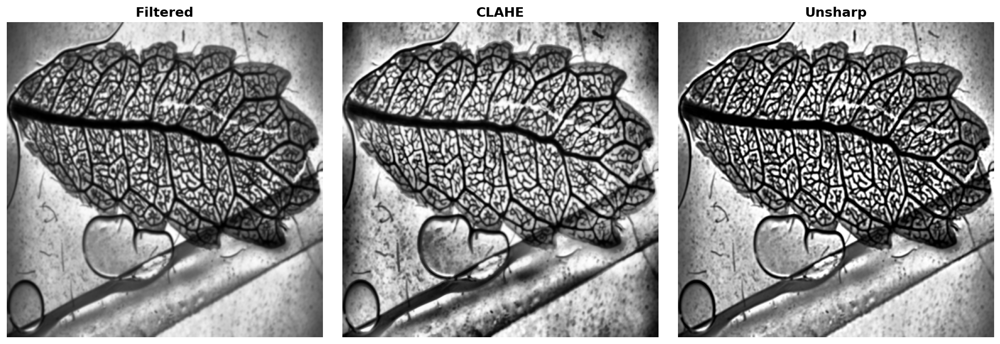

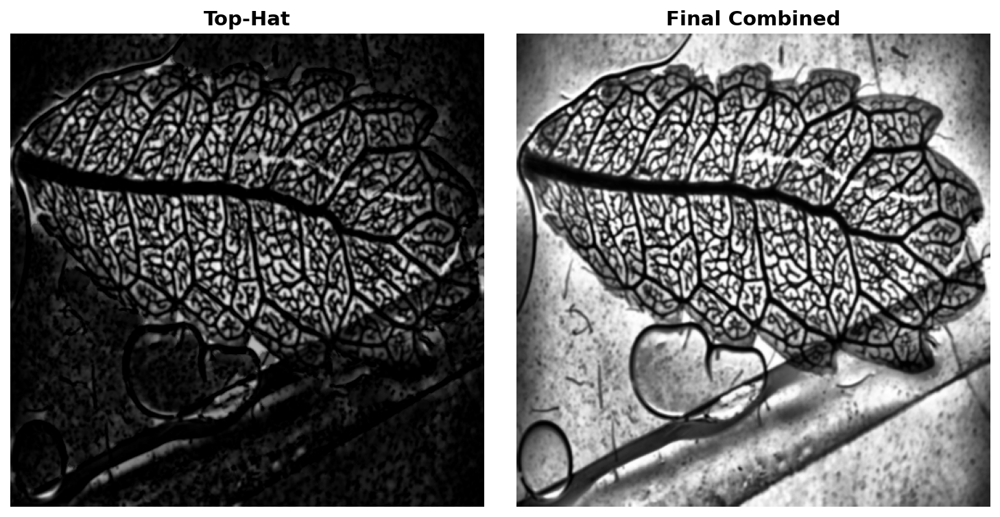


Enhancement Summary
               Method    Status
                CLAHE Completed
         Unsharp Mask Completed
Morphological Top-Hat Completed
 Combined Enhancement  Selected

----------------------------------------------------------------------
Phase 3A completed in 14.822 sec.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 3A
# Contrast Enhancement
# ==========================================================

start_time = time.time()

print_header("Phase 3A - Contrast Enhancement")

# ----------------------------------------------------------
# Input Image
# ----------------------------------------------------------

# Reuse the filtered image from Phase 2
# (Fallback to disk if notebook is restarted)

try:
    filtered_image
except NameError:

    filtered_image = cv2.imread(
        os.path.join(IMAGES_DIR, "leaf_filtered.png"),
        cv2.IMREAD_GRAYSCALE
    )

    if filtered_image is None:
        raise FileNotFoundError(
            "Filtered image not found. Please run Phase 2 first."
        )

# ----------------------------------------------------------
# Enhancement Methods
# ----------------------------------------------------------

# CLAHE

clahe = cv2.createCLAHE(
    clipLimit=2.5,
    tileGridSize=(8,8)
)

clahe_image = clahe.apply(filtered_image)

# ----------------------------------------------------------
# Unsharp Mask
# ----------------------------------------------------------

blurred = cv2.GaussianBlur(
    filtered_image,
    (0,0),
    3
)

unsharp_image = cv2.addWeighted(
    filtered_image,
    1.8,
    blurred,
    -0.8,
    0
)

# ----------------------------------------------------------
# Morphological Top-Hat
# ----------------------------------------------------------

kernel = cv2.getStructuringElement(
    cv2.MORPH_ELLIPSE,
    (15,15)
)

tophat_image = cv2.morphologyEx(
    filtered_image,
    cv2.MORPH_TOPHAT,
    kernel
)

# ----------------------------------------------------------
# Combined Enhancement
# ----------------------------------------------------------

combined_image = cv2.addWeighted(
    clahe_image,
    0.6,
    unsharp_image,
    0.4,
    0
)

# ----------------------------------------------------------
# Save Images
# ----------------------------------------------------------

save_image(
    clahe_image,
    "leaf_clahe.png"
)

save_image(
    unsharp_image,
    "leaf_unsharp.png"
)

save_image(
    tophat_image,
    "leaf_tophat.png"
)

save_image(
    combined_image,
    "leaf_enhanced_combined.png"
)

# ----------------------------------------------------------
# Figure 4A - Individual Enhancement Methods
# ----------------------------------------------------------

titles_1 = [
    "Filtered",
    "CLAHE",
    "Unsharp"
]

images_1 = [
    filtered_image,
    clahe_image,
    unsharp_image
]

fig, ax = plt.subplots(
    1,
    3,
    figsize=(15,5)
)

for i in range(3):

    ax[i].imshow(
        images_1[i],
        cmap="gray"
    )

    ax[i].set_title(
        titles_1[i],
        fontsize=14,
        fontweight="bold"
    )

    ax[i].axis("off")

plt.tight_layout()

save_figure(
    "figure_04a_enhancement_methods.png"
)

plt.show()

# ----------------------------------------------------------
# Figure 4B - Top-Hat and Final Combined Enhancement
# ----------------------------------------------------------

titles_2 = [
    "Top-Hat",
    "Final Combined"
]

images_2 = [
    tophat_image,
    combined_image
]

fig, ax = plt.subplots(
    1,
    2,
    figsize=(10,5)
)

for i in range(2):

    ax[i].imshow(
        images_2[i],
        cmap="gray"
    )

    ax[i].set_title(
        titles_2[i],
        fontsize=14,
        fontweight="bold"
    )

    ax[i].axis("off")

plt.tight_layout()

save_figure(
    "figure_04b_final_enhancement.png"
)

plt.show()

# ----------------------------------------------------------
# Summary
# ----------------------------------------------------------

summary = pd.DataFrame({

    "Method":[

        "CLAHE",

        "Unsharp Mask",

        "Morphological Top-Hat",

        "Combined Enhancement"

    ],

    "Status":[

        "Completed",

        "Completed",

        "Completed",

        "Selected"

    ]

})

display_dataframe(
    summary,
    "Enhancement Summary"
)

print_footer(
    f"Phase 3A completed in {execution_time(start_time)} sec."
)

# Phase 3B – Enhancement Quality Evaluation

## Objective

The objective of this phase is to quantitatively evaluate the enhancement techniques using image quality metrics. The enhancement method providing the best balance between contrast improvement and structural preservation is selected for subsequent vein segmentation.

---

### Input

- Enhanced images generated in Phase 3A

### Evaluation Metrics

- Image Entropy
- Edge Strength
- Image Sharpness (Variance of Laplacian)
- RMS Contrast

### Output

- Enhancement comparison table
- Selected enhancement method
- Enhanced image for segmentation


PHASE 3B - ENHANCEMENT EVALUATION

Enhancement Evaluation
   Method  Entropy  Edge Strength  Sharpness  RMS Contrast
Bilateral    7.913         118.89     298.84         63.83
    CLAHE    7.979         156.11     571.91         69.82
  Unsharp    7.729         179.39     983.73         75.83
  Top-Hat    6.045          97.72     319.24         41.82
 Combined    7.979         165.02     676.56         70.81

Selected Enhancement Method : Combined


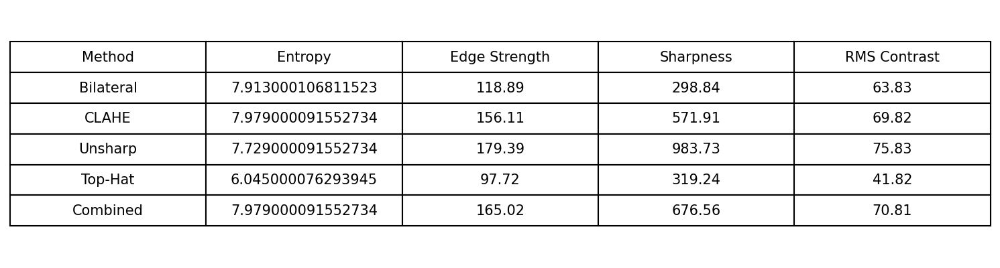


Phase Summary
                Item                                           Value
     Selected Method                                        Combined
   Metrics Evaluated Entropy, Edge Strength, Sharpness, RMS Contrast
Execution Time (sec)                                           0.367

----------------------------------------------------------------------
Phase 3B completed in 0.369 sec.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 3B
# Enhancement Quality Evaluation
# ==========================================================

start_time = time.time()

print_header("Phase 3B - Enhancement Evaluation")

# ----------------------------------------------------------
# Helper Functions
# ----------------------------------------------------------

def calculate_entropy(image):
    histogram = cv2.calcHist([image], [0], None, [256], [0, 256])
    histogram = histogram.ravel() / histogram.sum()
    histogram = histogram[histogram > 0]
    return -np.sum(histogram * np.log2(histogram))


def edge_strength(image):
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1)
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    return np.mean(magnitude)


def image_sharpness(image):
    return cv2.Laplacian(image, cv2.CV_64F).var()


def rms_contrast(image):
    return image.std()


# ----------------------------------------------------------
# Images to Evaluate
# ----------------------------------------------------------

enhancement_methods = {

    "Bilateral": filtered_image,

    "CLAHE": clahe_image,

    "Unsharp": unsharp_image,

    "Top-Hat": tophat_image,

    "Combined": combined_image

}

# ----------------------------------------------------------
# Calculate Metrics
# ----------------------------------------------------------

results = []

for method, image in enhancement_methods.items():

    results.append({

        "Method": method,

        "Entropy": round(calculate_entropy(image), 3),

        "Edge Strength": round(edge_strength(image), 2),

        "Sharpness": round(image_sharpness(image), 2),

        "RMS Contrast": round(rms_contrast(image), 2)

    })

evaluation_df = pd.DataFrame(results)

display_dataframe(
    evaluation_df,
    "Enhancement Evaluation"
)

save_table(
    evaluation_df,
    "table_03_enhancement_metrics.csv"
)

# ----------------------------------------------------------
# Select Best Enhancement
# ----------------------------------------------------------

selected_method = "Combined"
enhanced_image = enhancement_methods[selected_method]

save_image(
    enhanced_image,
    "enhanced_combined.png"
)

print(f"\nSelected Enhancement Method : {selected_method}")

# ----------------------------------------------------------
# Display Comparison Table
# ----------------------------------------------------------

fig, ax = plt.subplots(figsize=(10, 2.8))

ax.axis("off")

table = ax.table(
    cellText=evaluation_df.values,
    colLabels=evaluation_df.columns,
    loc="center",
    cellLoc="center"
)

table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1.2, 1.6)

plt.tight_layout()

save_figure(
    "figure_05_enhancement_metrics.png"
)

plt.show()

# ----------------------------------------------------------
# Phase Summary
# ----------------------------------------------------------

summary = pd.DataFrame({

    "Item": [

        "Selected Method",

        "Metrics Evaluated",

        "Execution Time (sec)"

    ],

    "Value": [

        selected_method,

        "Entropy, Edge Strength, Sharpness, RMS Contrast",

        execution_time(start_time)

    ]

})

display_dataframe(
    summary,
    "Phase Summary"
)

print_footer(
    f"Phase 3B completed in {execution_time(start_time)} sec."
)

# Phase 4A – Leaf Vein Segmentation

## Objective

The objective of this phase is to identify the most suitable segmentation technique for extracting the leaf vein network. Four commonly used segmentation methods are evaluated visually, and the most appropriate result is selected for further morphological refinement.

---

### Input

- Enhanced leaf image obtained from Phase 3

### Segmentation Methods

- Global Thresholding
- Otsu Thresholding
- Adaptive Gaussian Thresholding
- Canny Edge Detection

### Output

- Segmentation comparison figure
- Selected binary segmentation mask


PHASE 4A - LEAF VEIN SEGMENTATION

Selected Segmentation Method : Adaptive


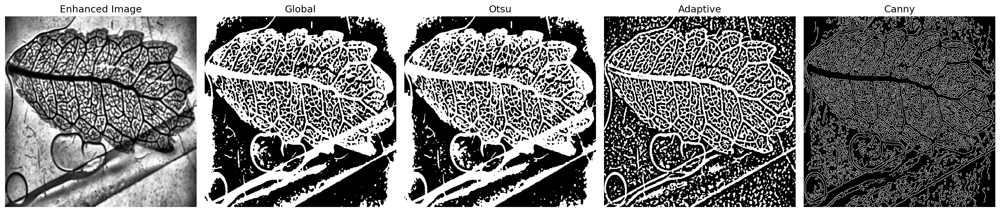


Phase Summary
                Item    Value
   Methods Evaluated        4
     Selected Method Adaptive
Execution Time (sec)    3.109

----------------------------------------------------------------------
Phase 4A completed in 3.111 sec.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 4A
# Leaf Vein Segmentation
# ==========================================================

start_time = time.time()

print_header("Phase 4A - Leaf Vein Segmentation")

# ----------------------------------------------------------
# Input Image
# ----------------------------------------------------------

try:
    enhanced_image
except NameError:

    enhanced_image = cv2.imread(
        os.path.join(IMAGES_DIR, "enhanced_combined.png"),
        cv2.IMREAD_GRAYSCALE
    )

    if enhanced_image is None:
        raise FileNotFoundError(
            "Enhanced image not found. Please run Phase 3 first."
        )

# ----------------------------------------------------------
# Segmentation Methods
# ----------------------------------------------------------

segmentations = {}

# Global Threshold

_, segmentations["Global"] = cv2.threshold(
    enhanced_image,
    120,
    255,
    cv2.THRESH_BINARY_INV
)

# Otsu Threshold

_, segmentations["Otsu"] = cv2.threshold(
    enhanced_image,
    0,
    255,
    cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
)

# Adaptive Threshold

segmentations["Adaptive"] = cv2.adaptiveThreshold(
    enhanced_image,
    255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY_INV,
    25,
    8
)

# Canny Edge Detection

segmentations["Canny"] = cv2.Canny(
    enhanced_image,
    50,
    150
)

# ----------------------------------------------------------
# Select Preferred Segmentation
# ----------------------------------------------------------

selected_method = "Adaptive"

segmented_image = segmentations[selected_method]

save_image(
    segmented_image,
    "leaf_segmentation_raw.png"
)

print(f"\nSelected Segmentation Method : {selected_method}")

# ----------------------------------------------------------
# Display Results
# ----------------------------------------------------------

titles = [

    "Enhanced Image",

    "Global",

    "Otsu",

    "Adaptive",

    "Canny"

]

images = [

    enhanced_image,

    segmentations["Global"],

    segmentations["Otsu"],

    segmentations["Adaptive"],

    segmentations["Canny"]

]

fig, ax = plt.subplots(
    1,
    5,
    figsize=(20,5)
)

for i in range(5):

    ax[i].imshow(
        images[i],
        cmap="gray"
    )

    ax[i].set_title(
        titles[i]
    )

    ax[i].axis("off")

plt.tight_layout()

save_figure(
    "figure_06_segmentation_comparison.png"
)

plt.show()

# ----------------------------------------------------------
# Summary
# ----------------------------------------------------------

summary = pd.DataFrame({

    "Item":[

        "Methods Evaluated",

        "Selected Method",

        "Execution Time (sec)"

    ],

    "Value":[

        len(segmentations),

        selected_method,

        execution_time(start_time)

    ]

})

display_dataframe(
    summary,
    "Phase Summary"
)

print_footer(
    f"Phase 4A completed in {execution_time(start_time)} sec."
)

# Phase 4B – Morphological Refinement

## Objective

The objective of this phase is to refine the segmented leaf vein network by removing isolated noise, connecting small gaps, and eliminating insignificant connected components. Morphological operations improve the continuity and quality of the segmentation before skeletonization.

---

### Input

- Binary segmentation mask obtained from Phase 4A

### Processing Steps

- Morphological Opening
- Morphological Closing
- Connected Component Analysis
- Small Object Removal

### Output

- Refined segmentation mask
- Morphological refinement statistics


PHASE 4B - MORPHOLOGICAL REFINEMENT

Morphological Refinement Statistics
             Stage  Foreground Pixels
Adaptive Threshold             101286
           Opening              96099
           Closing             112533
  Final Refinement             107173


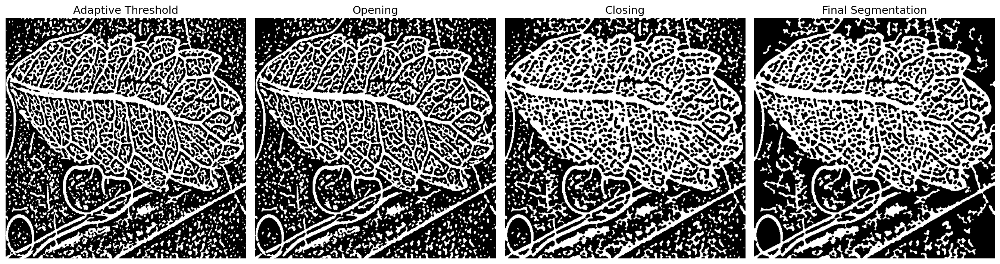


Phase Summary
                Item   Value
Connected Components 405.000
        Minimum Area  50.000
Execution Time (sec)   2.403

----------------------------------------------------------------------
Phase 4B completed in 2.405 sec.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 4B
# Morphological Refinement
# ==========================================================

start_time = time.time()

print_header("Phase 4B - Morphological Refinement")

# ----------------------------------------------------------
# Input Image
# ----------------------------------------------------------

try:
    segmented_image
except NameError:

    segmented_image = cv2.imread(
        os.path.join(IMAGES_DIR, "leaf_segmentation_raw.png"),
        cv2.IMREAD_GRAYSCALE
    )

    if segmented_image is None:
        raise FileNotFoundError(
            "Segmentation image not found. Please run Phase 4A first."
        )

# ----------------------------------------------------------
# Morphological Opening
# ----------------------------------------------------------

opening_kernel = cv2.getStructuringElement(
    cv2.MORPH_ELLIPSE,
    (3,3)
)

opened_image = cv2.morphologyEx(
    segmented_image,
    cv2.MORPH_OPEN,
    opening_kernel
)

# ----------------------------------------------------------
# Morphological Closing
# ----------------------------------------------------------

closing_kernel = cv2.getStructuringElement(
    cv2.MORPH_ELLIPSE,
    (5,5)
)

closed_image = cv2.morphologyEx(
    opened_image,
    cv2.MORPH_CLOSE,
    closing_kernel
)

# ----------------------------------------------------------
# Connected Component Analysis
# ----------------------------------------------------------

num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(
    closed_image,
    connectivity=8
)

minimum_area = 50

refined_segmentation = np.zeros_like(closed_image)

for label in range(1, num_labels):

    if stats[label, cv2.CC_STAT_AREA] >= minimum_area:

        refined_segmentation[labels == label] = 255

# ----------------------------------------------------------
# Save Result
# ----------------------------------------------------------

save_image(
    refined_segmentation,
    "leaf_segmentation_final.png"
)

# ----------------------------------------------------------
# Pixel Statistics
# ----------------------------------------------------------

statistics = pd.DataFrame({

    "Stage":[
        "Adaptive Threshold",
        "Opening",
        "Closing",
        "Final Refinement"
    ],

    "Foreground Pixels":[
        int(np.count_nonzero(segmented_image)),
        int(np.count_nonzero(opened_image)),
        int(np.count_nonzero(closed_image)),
        int(np.count_nonzero(refined_segmentation))
    ]

})

display_dataframe(
    statistics,
    "Morphological Refinement Statistics"
)

save_table(
    statistics,
    "table_04_morphological_statistics.csv"
)

# ----------------------------------------------------------
# Display Results
# ----------------------------------------------------------

titles = [

    "Adaptive Threshold",

    "Opening",

    "Closing",

    "Final Segmentation"

]

images = [

    segmented_image,

    opened_image,

    closed_image,

    refined_segmentation

]

fig, ax = plt.subplots(
    1,
    4,
    figsize=(18,5)
)

for i in range(4):

    ax[i].imshow(
        images[i],
        cmap="gray"
    )

    ax[i].set_title(
        titles[i]
    )

    ax[i].axis("off")

plt.tight_layout()

save_figure(
    "figure_07_morphological_refinement.png"
)

plt.show()

# ----------------------------------------------------------
# Phase Summary
# ----------------------------------------------------------

summary = pd.DataFrame({

    "Item":[

        "Connected Components",

        "Minimum Area",

        "Execution Time (sec)"

    ],

    "Value":[

        num_labels - 1,

        minimum_area,

        execution_time(start_time)

    ]

})

display_dataframe(
    summary,
    "Phase Summary"
)

print_footer(
    f"Phase 4B completed in {execution_time(start_time)} sec."
)

# Phase 4C – Segmentation Evaluation

## Objective

The objective of this phase is to quantitatively evaluate the quality of the refined segmentation by measuring several descriptive properties of the extracted vein network. These metrics provide insight into the completeness, connectivity, and complexity of the segmentation before skeletonization.

---

### Input

- Refined segmentation mask obtained from Phase 4B

### Evaluation Metrics

- Foreground pixels
- Background pixels
- Vein coverage
- Connected components
- Largest connected component
- Mean component area
- Small connected components
- Segmentation complexity

### Output

- Segmentation evaluation table
- Segmentation metrics (CSV)


PHASE 4C - SEGMENTATION EVALUATION

Segmentation Evaluation
                   Metric     Value
               Image Size 512 × 512
        Foreground Pixels    107173
        Background Pixels    154971
        Vein Coverage (%)     40.88
     Connected Components        80
        Largest Component     94948
      Mean Component Area   1339.66
Small Components (<20 px)         0
  Segmentation Complexity   1339.66


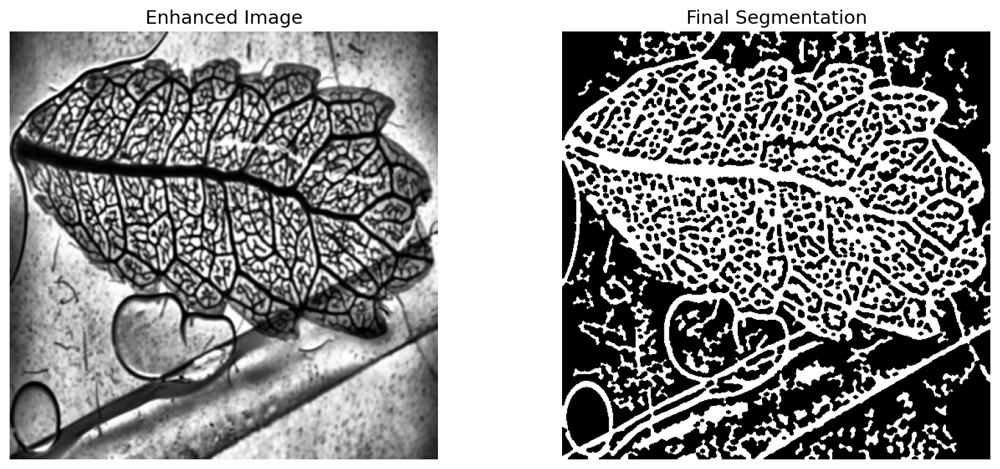


Phase Summary
                Item  Value
Connected Components 80.000
   Vein Coverage (%) 40.880
Execution Time (sec)  1.583

----------------------------------------------------------------------
Phase 4C completed in 1.584 sec.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 4C
# Segmentation Evaluation
# ==========================================================

start_time = time.time()

print_header("Phase 4C - Segmentation Evaluation")

# ----------------------------------------------------------
# Input Image
# ----------------------------------------------------------

try:
    refined_segmentation
except NameError:

    refined_segmentation = cv2.imread(
        os.path.join(IMAGES_DIR, "leaf_segmentation_final.png"),
        cv2.IMREAD_GRAYSCALE
    )

    if refined_segmentation is None:
        raise FileNotFoundError(
            "Final segmentation not found. Please run Phase 4B first."
        )

# ----------------------------------------------------------
# Connected Components
# ----------------------------------------------------------

num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(
    refined_segmentation,
    connectivity=8
)

foreground_pixels = int(np.count_nonzero(refined_segmentation))

background_pixels = refined_segmentation.size - foreground_pixels

vein_coverage = foreground_pixels / refined_segmentation.size * 100

component_areas = stats[1:, cv2.CC_STAT_AREA]

largest_component = int(component_areas.max()) if len(component_areas) > 0 else 0

mean_component_area = (
    float(component_areas.mean())
    if len(component_areas) > 0 else 0
)

small_components = int(np.sum(component_areas < 20))

segmentation_complexity = (
    mean_component_area
    if len(component_areas) > 0 else 0
)

# ----------------------------------------------------------
# Metrics Table
# ----------------------------------------------------------

metrics_df = pd.DataFrame({

    "Metric":[

        "Image Size",

        "Foreground Pixels",

        "Background Pixels",

        "Vein Coverage (%)",

        "Connected Components",

        "Largest Component",

        "Mean Component Area",

        "Small Components (<20 px)",

        "Segmentation Complexity"

    ],

    "Value":[

        f"{refined_segmentation.shape[0]} × {refined_segmentation.shape[1]}",

        foreground_pixels,

        background_pixels,

        round(vein_coverage,2),

        num_labels-1,

        largest_component,

        round(mean_component_area,2),

        small_components,

        round(segmentation_complexity,2)

    ]

})

display_dataframe(
    metrics_df,
    "Segmentation Evaluation"
)

save_table(
    metrics_df,
    "table_05_segmentation_metrics.csv"
)

# ----------------------------------------------------------
# Segmentation Overview Figure
# ----------------------------------------------------------

fig, ax = plt.subplots(
    1,
    2,
    figsize=(12,5)
)

ax[0].imshow(
    enhanced_image,
    cmap="gray"
)

ax[0].set_title("Enhanced Image")

ax[0].axis("off")

ax[1].imshow(
    refined_segmentation,
    cmap="gray"
)

ax[1].set_title("Final Segmentation")

ax[1].axis("off")

plt.tight_layout()

save_figure(
    "figure_08_final_segmentation.png"
)

plt.show()

# ----------------------------------------------------------
# Phase Summary
# ----------------------------------------------------------

summary = pd.DataFrame({

    "Item":[

        "Connected Components",

        "Vein Coverage (%)",

        "Execution Time (sec)"

    ],

    "Value":[

        num_labels - 1,

        round(vein_coverage,2),

        execution_time(start_time)

    ]

})

display_dataframe(
    summary,
    "Phase Summary"
)

print_footer(
    f"Phase 4C completed in {execution_time(start_time)} sec."
)

# Phase 5A – Skeletonization

## Objective

The objective of this phase is to convert the refined binary vein segmentation into a one-pixel-wide skeleton while preserving the topological structure of the leaf vein network. Skeletonization simplifies the segmented veins and provides the basis for quantitative network analysis.

---

### Input

- Refined leaf vein segmentation mask

### Processing Steps

- Skeletonization using morphological thinning
- Overlay visualization

### Output

- Skeleton image
- Skeleton overlay
- Skeleton statistics


PHASE 5A - SKELETONIZATION

Skeleton Statistics
             Metric     Value
Segmentation Pixels 107173.00
    Skeleton Pixels  21354.00
      Reduction (%)     19.92


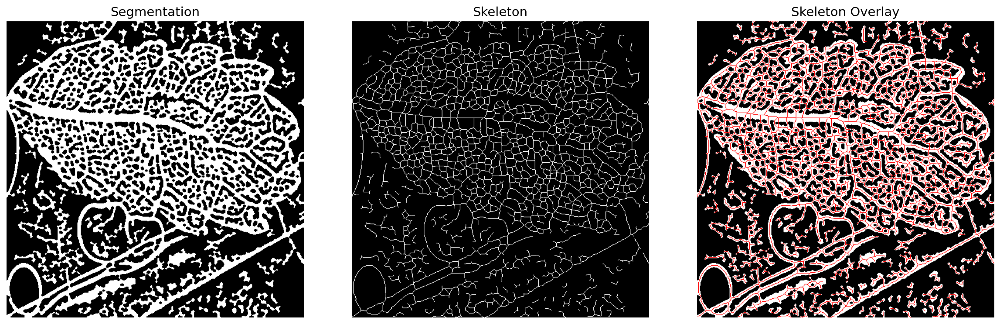


Phase Summary
                Item     Value
     Skeleton Pixels 21354.000
       Reduction (%)    19.920
Execution Time (sec)     1.772

----------------------------------------------------------------------
Phase 5A completed in 1.774 sec.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 5A
# Skeletonization
# ==========================================================

start_time = time.time()

print_header("Phase 5A - Skeletonization")

# ----------------------------------------------------------
# Input Image
# ----------------------------------------------------------

try:
    refined_segmentation
except NameError:

    refined_segmentation = cv2.imread(
        os.path.join(IMAGES_DIR, "leaf_segmentation_final.png"),
        cv2.IMREAD_GRAYSCALE
    )

    if refined_segmentation is None:
        raise FileNotFoundError(
            "Final segmentation not found. Please run Phase 4B first."
        )

# ----------------------------------------------------------
# Skeletonization
# ----------------------------------------------------------

binary_image = refined_segmentation > 0

vein_skeleton = skeletonize(binary_image)

vein_skeleton = (
    vein_skeleton.astype(np.uint8) * 255
)

save_image(
    vein_skeleton,
    "leaf_skeleton.png"
)

# ----------------------------------------------------------
# Overlay
# ----------------------------------------------------------

overlay = cv2.cvtColor(
    refined_segmentation,
    cv2.COLOR_GRAY2BGR
)

overlay[vein_skeleton > 0] = [255, 0, 0]

# ----------------------------------------------------------
# Statistics
# ----------------------------------------------------------

segmentation_pixels = np.count_nonzero(
    refined_segmentation
)

skeleton_pixels = np.count_nonzero(
    vein_skeleton
)

reduction = (
    skeleton_pixels /
    segmentation_pixels
) * 100

statistics = pd.DataFrame({

    "Metric":[

        "Segmentation Pixels",

        "Skeleton Pixels",

        "Reduction (%)"

    ],

    "Value":[

        segmentation_pixels,

        skeleton_pixels,

        round(reduction,2)

    ]

})

display_dataframe(
    statistics,
    "Skeleton Statistics"
)

save_table(
    statistics,
    "table_06_skeleton_statistics.csv"
)

# ----------------------------------------------------------
# Display
# ----------------------------------------------------------

fig, ax = plt.subplots(
    1,
    3,
    figsize=(16,5)
)

ax[0].imshow(
    refined_segmentation,
    cmap="gray"
)

ax[0].set_title(
    "Segmentation"
)

ax[0].axis("off")

ax[1].imshow(
    vein_skeleton,
    cmap="gray"
)

ax[1].set_title(
    "Skeleton"
)

ax[1].axis("off")

ax[2].imshow(
    overlay
)

ax[2].set_title(
    "Skeleton Overlay"
)

ax[2].axis("off")

plt.tight_layout()

save_figure(
    "figure_09_skeletonization.png"
)

plt.show()

# ----------------------------------------------------------
# Summary
# ----------------------------------------------------------

summary = pd.DataFrame({

    "Item":[

        "Skeleton Pixels",

        "Reduction (%)",

        "Execution Time (sec)"

    ],

    "Value":[

        skeleton_pixels,

        round(reduction,2),

        execution_time(start_time)

    ]

})

display_dataframe(
    summary,
    "Phase Summary"
)

print_footer(
    f"Phase 5A completed in {execution_time(start_time)} sec."
)

# Phase 5B – Vein Network Analysis

## Objective

The objective of this phase is to analyse the topology of the extracted leaf vein skeleton by identifying endpoints and junction points. These topological features describe the connectivity and branching characteristics of the vein network.

---

### Input

- Skeletonized leaf vein image

### Processing Steps

- Detect neighbouring skeleton pixels
- Identify endpoints
- Identify junction points
- Generate coloured network overlay

### Output

- Endpoint map
- Junction map
- Vein network overlay
- Network statistics


PHASE 5B - VEIN NETWORK ANALYSIS

Vein Network Statistics
         Metric  Value
Skeleton Pixels  21354
      Endpoints    524
Junction Pixels    777


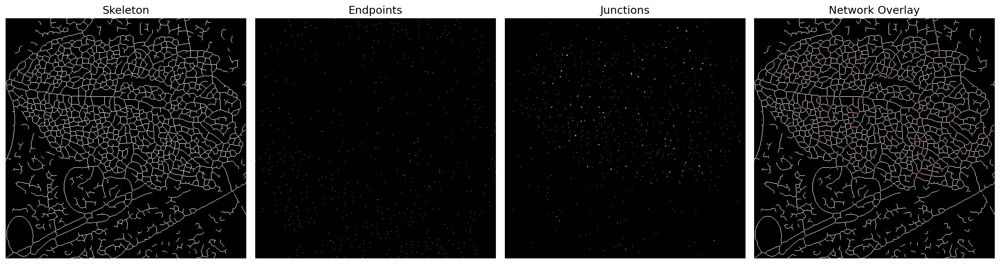


Phase Summary
                Item   Value
           Endpoints 524.000
     Junction Pixels 777.000
Execution Time (sec)   1.892

----------------------------------------------------------------------
Phase 5B completed in 1.894 sec.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 5B
# Vein Network Analysis
# ==========================================================

start_time = time.time()

print_header("Phase 5B - Vein Network Analysis")

# ----------------------------------------------------------
# Input Image
# ----------------------------------------------------------

try:
    vein_skeleton
except NameError:

    vein_skeleton = cv2.imread(
        os.path.join(IMAGES_DIR, "leaf_skeleton.png"),
        cv2.IMREAD_GRAYSCALE
    )

    if vein_skeleton is None:
        raise FileNotFoundError(
            "Skeleton image not found. Please run Phase 5A first."
        )

binary = (vein_skeleton > 0).astype(np.uint8)

# ----------------------------------------------------------
# Count Neighbours
# ----------------------------------------------------------

kernel = np.array([
    [1,1,1],
    [1,10,1],
    [1,1,1]
], dtype=np.uint8)

neighbour_count = cv2.filter2D(
    binary,
    -1,
    kernel
)

# ----------------------------------------------------------
# Endpoints
# ----------------------------------------------------------

endpoint_mask = np.logical_and(
    binary == 1,
    neighbour_count == 11
)

# ----------------------------------------------------------
# Junctions
# ----------------------------------------------------------

junction_mask = np.logical_and(
    binary == 1,
    neighbour_count >= 14
)

endpoint_pixels = int(np.count_nonzero(endpoint_mask))

junction_pixels = int(np.count_nonzero(junction_mask))

# ----------------------------------------------------------
# Create Overlay
# ----------------------------------------------------------

network_overlay = cv2.cvtColor(
    vein_skeleton,
    cv2.COLOR_GRAY2BGR
)

# Skeleton → White
network_overlay[binary == 1] = (255,255,255)

# Endpoints → Green
network_overlay[endpoint_mask] = (0,255,0)

# Junctions → Red
network_overlay[junction_mask] = (255,0,0)

# ----------------------------------------------------------
# Save Images
# ----------------------------------------------------------

save_image(
    (endpoint_mask.astype(np.uint8))*255,
    "leaf_endpoints.png"
)

save_image(
    (junction_mask.astype(np.uint8))*255,
    "leaf_junctions.png"
)

cv2.imwrite(
    os.path.join(
        IMAGES_DIR,
        "leaf_network_overlay.png"
    ),
    network_overlay
)

# ----------------------------------------------------------
# Statistics
# ----------------------------------------------------------

network_statistics = pd.DataFrame({

    "Metric":[

        "Skeleton Pixels",

        "Endpoints",

        "Junction Pixels"

    ],

    "Value":[

        int(np.count_nonzero(binary)),

        endpoint_pixels,

        junction_pixels

    ]

})

display_dataframe(
    network_statistics,
    "Vein Network Statistics"
)

save_table(
    network_statistics,
    "table_07_network_statistics.csv"
)

# ----------------------------------------------------------
# Display
# ----------------------------------------------------------

fig, ax = plt.subplots(
    1,
    4,
    figsize=(18,5)
)

ax[0].imshow(
    vein_skeleton,
    cmap="gray"
)
ax[0].set_title("Skeleton")
ax[0].axis("off")

ax[1].imshow(
    endpoint_mask,
    cmap="gray"
)
ax[1].set_title("Endpoints")
ax[1].axis("off")

ax[2].imshow(
    junction_mask,
    cmap="gray"
)
ax[2].set_title("Junctions")
ax[2].axis("off")

ax[3].imshow(
    network_overlay
)
ax[3].set_title("Network Overlay")
ax[3].axis("off")

plt.tight_layout()

save_figure(
    "figure_10_vein_network_analysis.png"
)

plt.show()

# ----------------------------------------------------------
# Summary
# ----------------------------------------------------------

summary = pd.DataFrame({

    "Item":[

        "Endpoints",

        "Junction Pixels",

        "Execution Time (sec)"

    ],

    "Value":[

        endpoint_pixels,

        junction_pixels,

        execution_time(start_time)

    ]

})

display_dataframe(
    summary,
    "Phase Summary"
)

print_footer(
    f"Phase 5B completed in {execution_time(start_time)} sec."
)

# Phase 5C – Refined Vein Network

## Objective

The objective of this phase is to refine the detected junction pixels into individual junction points, generate the final annotated vein network, and compute the topological properties that will be used during feature extraction.

---

### Input

- Skeleton image
- Endpoint map
- Junction pixel map

### Processing Steps

- Merge neighbouring junction pixels
- Compute refined junction centroids
- Generate final network overlay

### Output

- Refined junction map
- Final annotated vein network
- Network topology statistics


PHASE 5C - REFINED VEIN NETWORK

Refined Network Statistics
             Metric  Value
    Skeleton Pixels  21354
          Endpoints    524
Raw Junction Pixels    777
  Refined Junctions    569


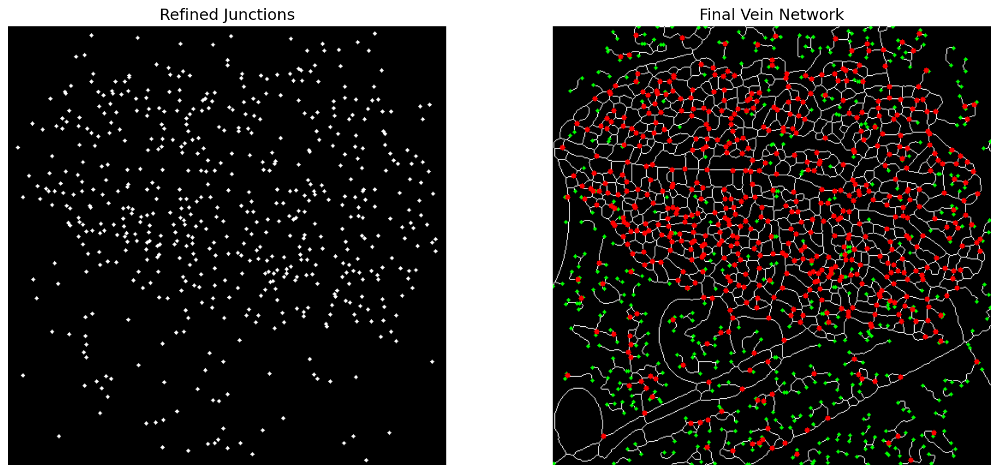


Phase Summary
                Item   Value
           Endpoints 524.000
   Refined Junctions 569.000
Execution Time (sec)   0.895

----------------------------------------------------------------------
Phase 5C completed in 0.896 sec.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 5C
# Refined Vein Network
# ==========================================================

start_time = time.time()

print_header("Phase 5C - Refined Vein Network")

# ----------------------------------------------------------
# Refine Junction Pixels
# ----------------------------------------------------------

junction_image = (
    junction_mask.astype(np.uint8) * 255
)

num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
    junction_image,
    connectivity=8
)

refined_junctions = np.zeros_like(junction_image)

junction_centers = []

for label in range(1, num_labels):

    cx, cy = centroids[label]

    cx = int(round(cx))
    cy = int(round(cy))

    junction_centers.append((cx, cy))

    cv2.circle(
        refined_junctions,
        (cx, cy),
        2,
        255,
        -1
    )

refined_junction_count = len(junction_centers)

# ----------------------------------------------------------
# Final Network Overlay
# ----------------------------------------------------------

final_overlay = cv2.cvtColor(
    vein_skeleton,
    cv2.COLOR_GRAY2BGR
)

# Skeleton → White
final_overlay[binary == 1] = (255,255,255)

# Endpoints → Green
ys, xs = np.where(endpoint_mask)

for x, y in zip(xs, ys):

    cv2.circle(
        final_overlay,
        (x, y),
        2,
        (0,255,0),
        -1
    )

# Refined Junctions → Red
for x, y in junction_centers:

    cv2.circle(
        final_overlay,
        (x, y),
        3,
        (255,0,0),
        -1
    )

# ----------------------------------------------------------
# Save Outputs
# ----------------------------------------------------------

save_image(
    refined_junctions,
    "leaf_refined_junctions.png"
)

cv2.imwrite(
    os.path.join(
        IMAGES_DIR,
        "leaf_network_refined.png"
    ),
    final_overlay
)

# ----------------------------------------------------------
# Statistics
# ----------------------------------------------------------

statistics = pd.DataFrame({

    "Metric":[

        "Skeleton Pixels",

        "Endpoints",

        "Raw Junction Pixels",

        "Refined Junctions"

    ],

    "Value":[

        int(np.count_nonzero(binary)),

        endpoint_pixels,

        junction_pixels,

        refined_junction_count

    ]

})

display_dataframe(
    statistics,
    "Refined Network Statistics"
)

save_table(
    statistics,
    "table_08_refined_network_statistics.csv"
)

# ----------------------------------------------------------
# Display
# ----------------------------------------------------------

fig, ax = plt.subplots(
    1,
    2,
    figsize=(14,6)
)

ax[0].imshow(
    refined_junctions,
    cmap="gray"
)

ax[0].set_title("Refined Junctions")

ax[0].axis("off")

ax[1].imshow(
    final_overlay
)

ax[1].set_title("Final Vein Network")

ax[1].axis("off")

plt.tight_layout()

save_figure(
    "figure_11_refined_network.png"
)

plt.show()

# ----------------------------------------------------------
# Phase Summary
# ----------------------------------------------------------

summary = pd.DataFrame({

    "Item":[

        "Endpoints",

        "Refined Junctions",

        "Execution Time (sec)"

    ],

    "Value":[

        endpoint_pixels,

        refined_junction_count,

        execution_time(start_time)

    ]

})

display_dataframe(
    summary,
    "Phase Summary"
)

print_footer(
    f"Phase 5C completed in {execution_time(start_time)} sec."
)

# Phase 6A – Feature Extraction Function

## Objective

The objective of this phase is to develop a reusable feature extraction function capable of computing quantitative leaf vein descriptors from a processed binary vein network. The same function will later be used to analyse the complete dataset.

---

### Input

- Final refined vein network

### Extracted Features

- Segmented Area
- Skeleton Length
- Vein Density
- Vein Coverage
- Skeleton Reduction
- Endpoints
- Refined Junctions
- Connectivity Index

### Output

- Dictionary containing all extracted features

In [ ]:
# ==========================================================
# PHASE 6A
# Feature Extraction Function
# ==========================================================

print_header("Phase 6A - Feature Extraction Function")


def extract_leaf_features(
    segmentation,
    skeleton,
    endpoint_count,
    junction_count
):
    """
    Extract quantitative leaf vein features.
    """

    image_area = segmentation.shape[0] * segmentation.shape[1]

    segmented_area = int(
        np.count_nonzero(segmentation)
    )

    skeleton_length = int(
        np.count_nonzero(skeleton)
    )

    vein_density = skeleton_length / image_area

    vein_coverage = segmented_area / image_area

    skeleton_reduction = skeleton_length / segmented_area

    endpoint_density = endpoint_count / image_area

    junction_density = junction_count / image_area

    connectivity = (
        junction_count / endpoint_count
        if endpoint_count > 0 else 0
    )

    return {

        "Image Area": image_area,

        "Segmented Area": segmented_area,

        "Skeleton Length": skeleton_length,

        "Vein Density": vein_density,

        "Vein Coverage": vein_coverage,

        "Skeleton Reduction": skeleton_reduction,

        "Endpoints": endpoint_count,

        "Junctions": junction_count,

        "Endpoint Density": endpoint_density,

        "Junction Density": junction_density,

        "Connectivity": connectivity

    }


print_footer(
    "Feature extraction function created successfully."
)


PHASE 6A - FEATURE EXTRACTION FUNCTION

----------------------------------------------------------------------
Feature extraction function created successfully.
----------------------------------------------------------------------


# Phase 6B – Feature Extraction

## Objective

The objective of this phase is to compute quantitative descriptors from the refined leaf vein network. These handcrafted features provide a numerical representation of the structural properties of the leaf venation and will be used throughout the remainder of the project.

---

### Input

- Refined segmentation
- Skeleton
- Refined junctions

### Output

- Leaf feature table
- Feature CSV

In [ ]:
# ==========================================================
# PHASE 6B
# Feature Extraction
# ==========================================================

start_time = time.time()

print_header("Phase 6B - Feature Extraction")

leaf_features = extract_leaf_features(

    refined_segmentation,

    vein_skeleton,

    endpoint_pixels,

    refined_junction_count

)

feature_table = pd.DataFrame({

    "Feature": list(leaf_features.keys()),

    "Value": [

        round(v,6) if isinstance(v,float) else v

        for v in leaf_features.values()

    ]

})

display_dataframe(
    feature_table,
    "Leaf Vein Features"
)

save_table(
    feature_table,
    "table_09_leaf_features.csv"
)

summary = pd.DataFrame({

    "Item":[

        "Features Extracted",

        "Execution Time (sec)"

    ],

    "Value":[

        len(feature_table),

        execution_time(start_time)

    ]

})

display_dataframe(
    summary,
    "Phase Summary"
)

print_footer(
    f"Phase 6B completed in {execution_time(start_time)} sec."
)


PHASE 6B - FEATURE EXTRACTION

Leaf Vein Features
           Feature         Value
        Image Area 262144.000000
    Segmented Area 107173.000000
   Skeleton Length  21354.000000
      Vein Density      0.081459
     Vein Coverage      0.408833
Skeleton Reduction      0.199248
         Endpoints    524.000000
         Junctions    569.000000
  Endpoint Density      0.001999
  Junction Density      0.002171
      Connectivity      1.085878

Phase Summary
                Item  Value
  Features Extracted 11.000
Execution Time (sec)  0.012

----------------------------------------------------------------------
Phase 6B completed in 0.014 sec.
----------------------------------------------------------------------


# Phase 7A – Batch Processing Framework

## Objective

The objective of this phase is to automatically process every image in the leaf dataset using the same feature extraction pipeline developed in Phase 6. Each image is analysed independently, and the extracted features are stored in a structured dataset for subsequent statistical and machine learning analyses.

---

### Input

- CHAMBASA Leaf Dataset

### Processing Steps

- Read each image
- Standardize image dimensions
- Apply the complete feature extraction pipeline
- Store extracted features

### Output

- Dataset feature table

In [ ]:
# ==========================================================
# PHASE 7A
# Batch Processing Framework
# ==========================================================

print_header("Phase 7A - Batch Processing Framework")

# ----------------------------------------------------------
# Collect Dataset Images
# ----------------------------------------------------------

dataset_path = Path(DATASET_PATH)

image_extensions = {

    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".tif",
    ".tiff"

}

image_files = sorted([

    file

    for file in dataset_path.rglob("*")

    if file.suffix.lower() in image_extensions

])

print(f"\nDataset Folder : {dataset_path}")

print(f"Images Found   : {len(image_files)}")

if len(image_files) == 0:

    raise RuntimeError(
        "No images were found in the dataset directory."
    )

print_footer(
    "Dataset successfully loaded."
)


PHASE 7A - BATCH PROCESSING FRAMEWORK

Dataset Folder : /content/drive/MyDrive/CHAMBASA leaves
Images Found   : 900

----------------------------------------------------------------------
Dataset successfully loaded.
----------------------------------------------------------------------


# Phase 7B – Dataset Feature Extraction

## Objective

The objective of this phase is to apply the complete feature extraction pipeline to every image in the dataset and create a structured feature table for statistical analysis and machine learning.

---

### Output

- Feature dataset
- Dataset processing summary

In [ ]:
# ==========================================================
# PHASE 7B
# Dataset Feature Extraction
# ==========================================================

start_time = time.time()

print_header("Phase 7B - Dataset Feature Extraction")

dataset_features = []

for index, image_path in enumerate(image_files, start=1):

    image = cv2.imread(
        str(image_path),
        cv2.IMREAD_GRAYSCALE
    )

    if image is None:
        continue

    image = resize_image(image)

    image = normalize_image(image)

    # ------------------------------------------------------
    # Noise Reduction
    # ------------------------------------------------------

    image = cv2.bilateralFilter(
        image,
        9,
        50,
        50
    )

    # ------------------------------------------------------
    # Enhancement
    # ------------------------------------------------------

    clahe = cv2.createCLAHE(
        clipLimit=2.5,
        tileGridSize=(8,8)
    )

    image = clahe.apply(image)

    blur = cv2.GaussianBlur(
        image,
        (0,0),
        3
    )

    image = cv2.addWeighted(
        image,
        0.6,
        cv2.addWeighted(
            image,
            1.8,
            blur,
            -0.8,
            0
        ),
        0.4,
        0
    )

    # ------------------------------------------------------
    # Segmentation
    # ------------------------------------------------------

    segmentation = cv2.adaptiveThreshold(
        image,
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        25,
        8
    )

    segmentation = cv2.morphologyEx(
        segmentation,
        cv2.MORPH_OPEN,
        cv2.getStructuringElement(
            cv2.MORPH_ELLIPSE,
            (3,3)
        )
    )

    segmentation = cv2.morphologyEx(
        segmentation,
        cv2.MORPH_CLOSE,
        cv2.getStructuringElement(
            cv2.MORPH_ELLIPSE,
            (5,5)
        )
    )

    # ------------------------------------------------------
    # Skeleton
    # ------------------------------------------------------

    skeleton = skeletonize(
        segmentation > 0
    ).astype(np.uint8)

    kernel = np.array([

        [1,1,1],

        [1,10,1],

        [1,1,1]

    ])

    neighbours = cv2.filter2D(
        skeleton,
        -1,
        kernel
    )

    endpoints = np.sum(
        np.logical_and(
            skeleton == 1,
            neighbours == 11
        )
    )

    junctions = np.sum(
        np.logical_and(
            skeleton == 1,
            neighbours >= 14
        )
    )

    features = extract_leaf_features(

        segmentation,

        skeleton,

        int(endpoints),

        int(junctions)

    )

    features["Image"] = image_path.name

    dataset_features.append(features)

# ----------------------------------------------------------
# Save Dataset
# ----------------------------------------------------------

dataset_df = pd.DataFrame(dataset_features)

columns = ["Image"] + [

    c for c in dataset_df.columns

    if c != "Image"

]

dataset_df = dataset_df[columns]

save_table(
    dataset_df,
    "table_10_leaf_dataset_features.csv"
)

display_dataframe(
    dataset_df.head(),
    "First Five Records"
)

summary = pd.DataFrame({

    "Item":[

        "Images Processed",

        "Features",

        "Execution Time (sec)"

    ],

    "Value":[

        len(dataset_df),

        dataset_df.shape[1]-1,

        execution_time(start_time)

    ]

})

display_dataframe(
    summary,
    "Processing Summary"
)

print_footer(
    f"Phase 7B completed in {execution_time(start_time)} sec."
)


PHASE 7B - DATASET FEATURE EXTRACTION

First Five Records
                    Image  Image Area  Segmented Area  Skeleton Length  Vein Density  Vein Coverage  Skeleton Reduction  Endpoints  Junctions  Endpoint Density  Junction Density  Connectivity
ACJ01-I2014-B1S-CLAHE.jpg      262144          133876            25512      0.097321       0.510696            0.190564        394        781          0.001503          0.002979      1.982234
ACJ01-T116-B11H-CLAHE.jpg      262144          119743            22950      0.087547       0.456783            0.191660        584        657          0.002228          0.002506      1.125000
ACJ01-T164-B11H-CLAHE.jpg      262144          127798            21791      0.083126       0.487511            0.170511        812        648          0.003098          0.002472      0.798030
ACJ01-T164-B1SB-CLAHE.jpg      262144          112579            17750      0.067711       0.429455            0.157667        649        371          0.002476          0.00

# Phase 8A – Dataset Summary Statistics

## Objective

The objective of this phase is to summarize the extracted leaf vein features across the complete dataset. Descriptive statistics provide an overview of the distribution and variability of each quantitative feature.

---

### Input

- Dataset feature table

### Output

- Summary statistics
- Statistical summary table

In [ ]:
# ==========================================================
# PHASE 8A
# Dataset Summary Statistics
# ==========================================================

start_time = time.time()

print_header("Phase 8A - Dataset Summary Statistics")

# ----------------------------------------------------------
# Load Dataset
# ----------------------------------------------------------

dataset_df = pd.read_csv(
    os.path.join(
        TABLES_DIR,
        "table_10_leaf_dataset_features.csv"
    )
)

print(f"Total Images : {len(dataset_df)}")

print("\nDataset Columns")

print(dataset_df.columns.tolist())

# ----------------------------------------------------------
# Summary Statistics
# ----------------------------------------------------------

summary_statistics = dataset_df.describe().round(3)

display(summary_statistics)

summary_statistics.to_csv(
    os.path.join(
        TABLES_DIR,
        "table_11_dataset_summary_statistics.csv"
    )
)

print_footer(
    f"Phase 8A completed in {execution_time(start_time)} sec."
)


PHASE 8A - DATASET SUMMARY STATISTICS
Total Images : 900

Dataset Columns
['Image', 'Image Area', 'Segmented Area', 'Skeleton Length', 'Vein Density', 'Vein Coverage', 'Skeleton Reduction', 'Endpoints', 'Junctions', 'Endpoint Density', 'Junction Density', 'Connectivity']


,Image Area,Segmented Area,Skeleton Length,Vein Density,Vein Coverage,Skeleton Reduction,Endpoints,Junctions,Endpoint Density,Junction Density,Connectivity
count,900.0,900.000,900.000,900.000,900.000,900.000,900.000,900.000,900.000,900.000,900.000
mean,262144.0,123321.606,24878.761,0.095,0.470,0.201,680.484,880.329,0.003,0.003,1.416
std,0.0,14347.139,4991.716,0.019,0.055,0.026,209.835,378.418,0.001,0.001,0.778
min,262144.0,79656.000,12614.000,0.048,0.304,0.125,181.000,109.000,0.001,0.000,0.244
25%,262144.0,114234.750,21158.750,0.081,0.436,0.185,534.750,587.500,0.002,0.002,0.798
50%,262144.0,123969.500,25518.000,0.097,0.473,0.204,653.000,879.000,0.002,0.003,1.270
75%,262144.0,133646.000,28696.000,0.109,0.510,0.219,790.000,1168.250,0.003,0.004,1.862
max,262144.0,162612.000,35543.000,0.136,0.620,0.258,1486.000,1841.000,0.006,0.007,4.427



----------------------------------------------------------------------
Phase 8A completed in 0.062 sec.
----------------------------------------------------------------------


# Phase 8B – Feature Distribution

## Objective

The objective of this phase is to visualize the distribution of the extracted leaf vein features using histograms. These plots provide insight into the variability and overall characteristics of the dataset.

---

### Input

- Dataset feature table

### Output

- Feature distribution histograms


PHASE 8B - FEATURE DISTRIBUTION


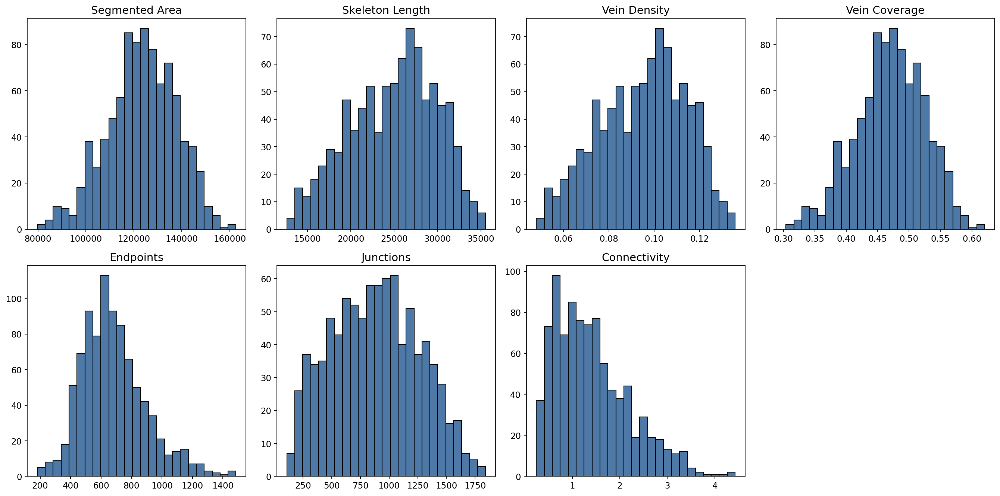


----------------------------------------------------------------------
Phase 8B completed in 2.862 sec.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 8B
# Feature Distribution
# ==========================================================

start_time = time.time()

print_header("Phase 8B - Feature Distribution")

features = [

    "Segmented Area",

    "Skeleton Length",

    "Vein Density",

    "Vein Coverage",

    "Endpoints",

    "Junctions",

    "Connectivity"

]

fig, axes = plt.subplots(
    2,
    4,
    figsize=(18,9)
)

axes = axes.flatten()

for i, feature in enumerate(features):

    axes[i].hist(
        dataset_df[feature],
        bins=25,
        color="#4E79A7",
        edgecolor="black"
    )

    axes[i].set_title(feature)

if len(features) < len(axes):

    for j in range(len(features), len(axes)):

        axes[j].axis("off")

plt.tight_layout()

save_figure(
    "figure_12_feature_distributions.png"
)

plt.show()

print_footer(
    f"Phase 8B completed in {execution_time(start_time)} sec."
)

# Phase 8C – Feature Correlation Analysis

## Objective

The objective of this phase is to investigate the relationships between extracted leaf vein features using Pearson correlation analysis.

---

### Input

- Dataset feature table

### Output

- Correlation matrix
- Correlation heatmap


PHASE 8C - FEATURE CORRELATION


,Image Area,Segmented Area,Skeleton Length,Vein Density,Vein Coverage,Skeleton Reduction,Endpoints,Junctions,Endpoint Density,Junction Density,Connectivity
Image Area,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Segmented Area,NaN,1.000,0.821,0.821,1.000,0.405,-0.448,0.769,-0.448,0.769,0.851
Skeleton Length,NaN,0.821,1.000,1.000,0.821,0.851,-0.113,0.976,-0.113,0.976,0.838
Vein Density,NaN,0.821,1.000,1.000,0.821,0.851,-0.113,0.976,-0.113,0.976,0.838
Vein Coverage,NaN,1.000,0.821,0.821,1.000,0.405,-0.448,0.769,-0.448,0.769,0.851
Skeleton Reduction,NaN,0.405,0.851,0.851,0.405,1.000,0.251,0.849,0.251,0.849,0.548
Endpoints,NaN,-0.448,-0.113,-0.113,-0.448,0.251,1.000,-0.030,1.000,-0.030,-0.510
Junctions,NaN,0.769,0.976,0.976,0.769,0.849,-0.030,1.000,-0.030,1.000,0.820
Endpoint Density,NaN,-0.448,-0.113,-0.113,-0.448,0.251,1.000,-0.030,1.000,-0.030,-0.510
Junction Density,NaN,0.769,0.976,0.976,0.769,0.849,-0.030,1.000,-0.030,1.000,0.820


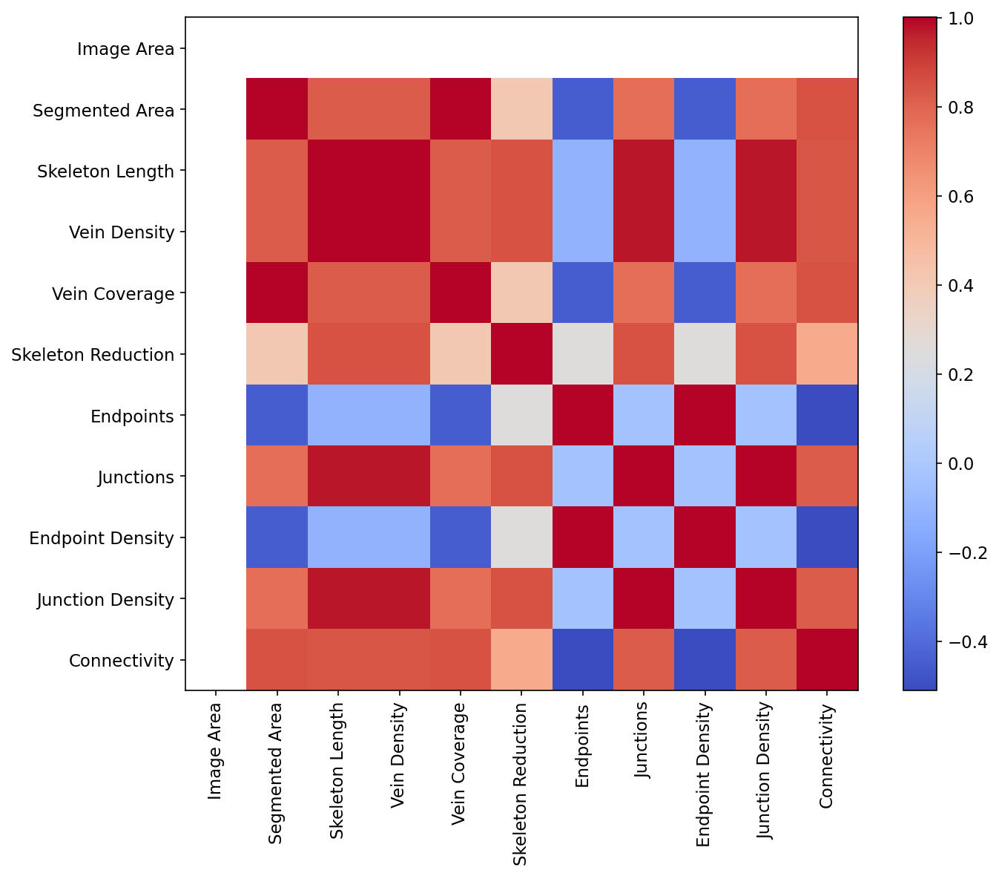


----------------------------------------------------------------------
Phase 8C completed in 0.994 sec.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 8C
# Feature Correlation Analysis
# ==========================================================

start_time = time.time()

print_header("Phase 8C - Feature Correlation")

correlation = dataset_df.drop(columns=["Image"]).corr()

display(correlation.round(3))

correlation.to_csv(

    os.path.join(

        TABLES_DIR,

        "table_12_feature_correlation.csv"

    )

)

plt.figure(figsize=(10,8))

plt.imshow(

    correlation,

    cmap="coolwarm",

    interpolation="nearest"

)

plt.xticks(

    range(len(correlation.columns)),

    correlation.columns,

    rotation=90

)

plt.yticks(

    range(len(correlation.columns)),

    correlation.columns

)

plt.colorbar()

plt.tight_layout()

save_figure(

    "figure_13_feature_correlation.png"

)

plt.show()

print_footer(

    f"Phase 8C completed in {execution_time(start_time)} sec."

)

# Phase 9 – Principal Component Analysis (PCA)

## Objective

The objective of this phase is to reduce the dimensionality of the extracted feature space using Principal Component Analysis (PCA). PCA identifies the dominant patterns of variation within the dataset while preserving most of the information contained in the original features.

---

### Input

- Extracted leaf feature dataset

### Output

- Explained variance plot
- PCA projection
- PCA loading matrix


PHASE 9 - PRINCIPAL COMPONENT ANALYSIS

Explained Variance
Principal Component  Explained Variance
                PC1              0.6909
                PC2              0.2501
                PC3              0.0432
                PC4              0.0111
                PC5              0.0045
                PC6              0.0002
                PC7              0.0000
                PC8              0.0000
                PC9              0.0000
               PC10              0.0000
               PC11              0.0000

PCA Loadings
   PC1    PC2    PC3    PC4    PC5    PC6    PC7    PC8  PC9   PC10   PC11
-0.000 -0.000  0.000 -0.000 -0.000  0.000 -0.000 -0.000  1.0 -0.000  0.000
 0.342 -0.177 -0.507 -0.155 -0.116  0.240 -0.688 -0.139  0.0 -0.019  0.084
 0.372  0.115  0.054 -0.239 -0.090 -0.529  0.129 -0.663  0.0  0.210  0.010
 0.372  0.115  0.054 -0.239 -0.090 -0.529 -0.129  0.663  0.0 -0.210 -0.010
 0.342 -0.177 -0.507 -0.155 -0.116  0.240  0.688  0.139  0.0  0.019 -0.

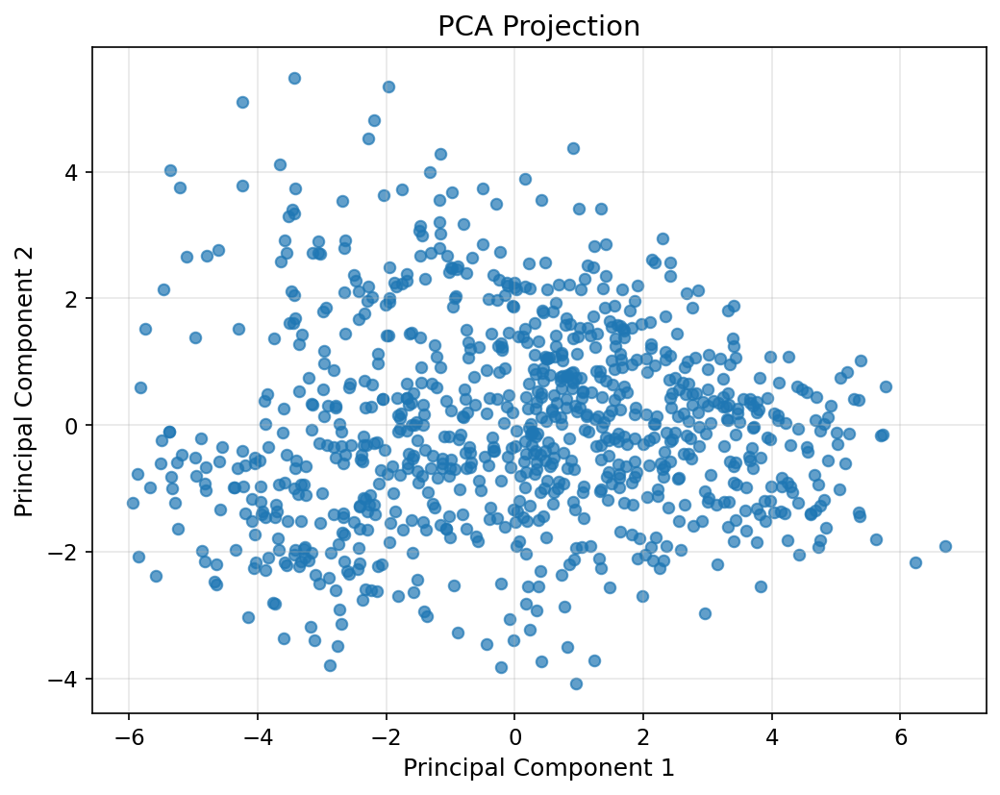

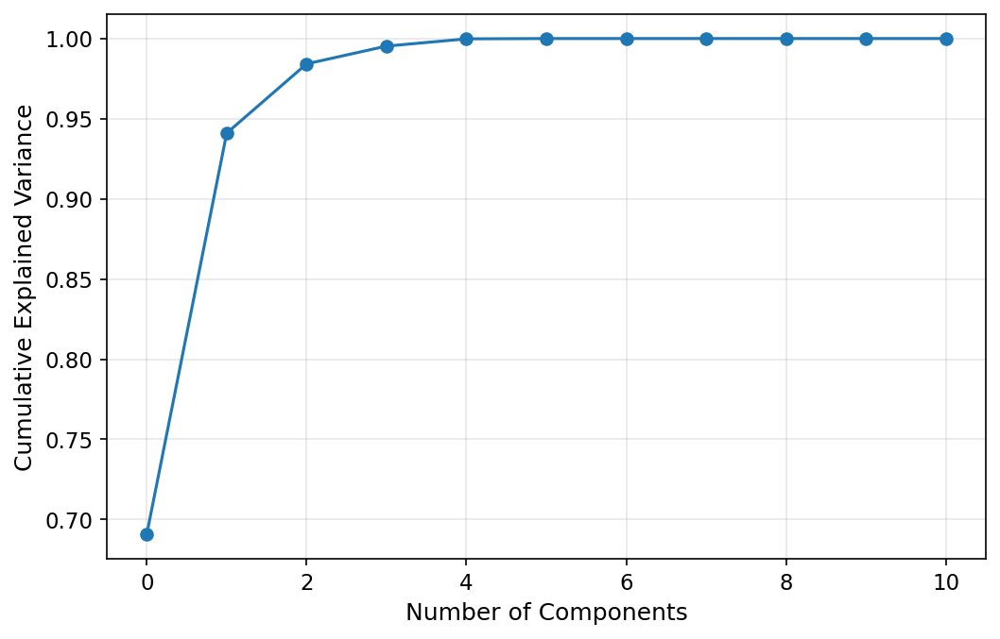


----------------------------------------------------------------------
Phase 9 completed in 0.825 sec.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 9
# Principal Component Analysis
# ==========================================================

start_time = time.time()

print_header("Phase 9 - Principal Component Analysis")

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# ----------------------------------------------------------
# Prepare Data
# ----------------------------------------------------------

X = dataset_df.drop(columns=["Image"])

feature_names = X.columns.tolist()

scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

# ----------------------------------------------------------
# PCA
# ----------------------------------------------------------

pca = PCA()

X_pca = pca.fit_transform(X_scaled)

# ----------------------------------------------------------
# Explained Variance
# ----------------------------------------------------------

variance_df = pd.DataFrame({

    "Principal Component":

        [f"PC{i+1}" for i in range(len(feature_names))],

    "Explained Variance":

        pca.explained_variance_ratio_.round(4)

})

display_dataframe(
    variance_df,
    "Explained Variance"
)

save_table(
    variance_df,
    "table_13_pca_variance.csv"
)

# ----------------------------------------------------------
# Loading Matrix
# ----------------------------------------------------------

loading_df = pd.DataFrame(

    pca.components_.T,

    columns=[

        f"PC{i+1}"

        for i in range(len(feature_names))

    ],

    index=feature_names

)

display_dataframe(
    loading_df.round(3),
    "PCA Loadings"
)

save_table(
    loading_df.round(4),
    "table_14_pca_loadings.csv"
)

# ----------------------------------------------------------
# Scatter Plot
# ----------------------------------------------------------

plt.figure(figsize=(8,6))

plt.scatter(

    X_pca[:,0],

    X_pca[:,1],

    s=30,

    alpha=0.7

)

plt.xlabel("Principal Component 1")

plt.ylabel("Principal Component 2")

plt.title("PCA Projection")

plt.grid(alpha=0.3)

save_figure(
    "figure_14_pca_projection.png"
)

plt.show()

# ----------------------------------------------------------
# Explained Variance Plot
# ----------------------------------------------------------

plt.figure(figsize=(8,5))

plt.plot(

    np.cumsum(

        pca.explained_variance_ratio_

    ),

    marker="o"

)

plt.xlabel("Number of Components")

plt.ylabel("Cumulative Explained Variance")

plt.grid(alpha=0.3)

save_figure(
    "figure_15_pca_variance.png"
)

plt.show()

print_footer(
    f"Phase 9 completed in {execution_time(start_time)} sec."
)

# Phase 10 – K-Means Clustering

## Objective

The objective of this phase is to group leaf images with similar vein characteristics using unsupervised K-Means clustering. Cluster analysis reveals natural groupings within the extracted feature space.

---

### Input

- PCA-transformed feature space

### Output

- Cluster visualization
- Cluster statistics


PHASE 10 - K-MEANS CLUSTERING

Cluster Distribution
 Cluster  Images
       0     220
       1     205
       2     336
       3     139

Cluster Statistics
 Image Area  Segmented Area  Skeleton Length  Vein Density  Vein Coverage  Skeleton Reduction  Endpoints  Junctions  Endpoint Density  Junction Density  Connectivity
   262144.0       111182.18         18611.06          0.07           0.42                0.17     587.32     410.21               0.0              0.00          0.74
   262144.0       140434.66         30962.92          0.12           0.54                0.22     560.11    1365.11               0.0              0.01          2.51
   262144.0       127096.89         26367.94          0.10           0.48                0.21     674.35     957.26               0.0              0.00          1.48
   262144.0       108170.54         22226.09          0.08           0.41                0.21    1020.29     723.47               0.0              0.00          0.72


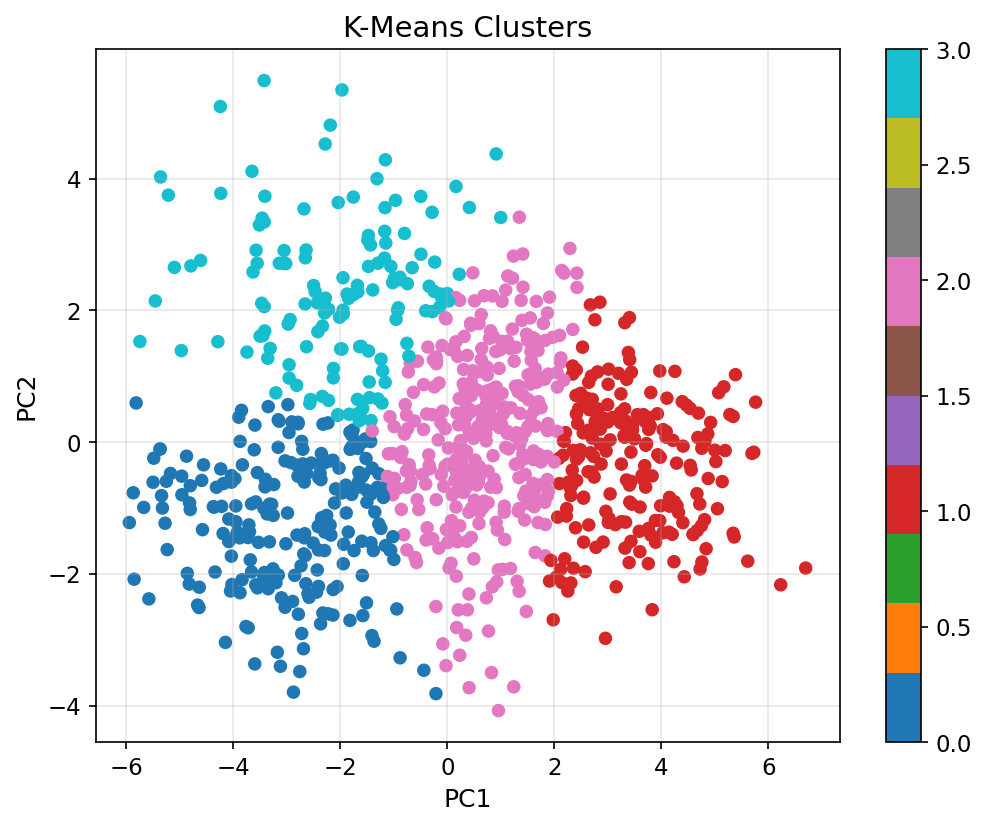


----------------------------------------------------------------------
Phase 10 completed in 0.565 sec.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 10
# K-Means Clustering
# ==========================================================

start_time = time.time()

print_header("Phase 10 - K-Means Clustering")

from sklearn.cluster import KMeans

# ----------------------------------------------------------
# KMeans
# ----------------------------------------------------------

kmeans = KMeans(

    n_clusters=4,

    random_state=RANDOM_STATE,

    n_init=10

)

clusters = kmeans.fit_predict(X_scaled)

dataset_df["Cluster"] = clusters

# ----------------------------------------------------------
# Cluster Distribution
# ----------------------------------------------------------

cluster_counts = dataset_df["Cluster"].value_counts().sort_index()

cluster_table = pd.DataFrame({

    "Cluster": cluster_counts.index,

    "Images": cluster_counts.values

})

display_dataframe(
    cluster_table,
    "Cluster Distribution"
)

save_table(
    cluster_table,
    "table_15_cluster_distribution.csv"
)

# ----------------------------------------------------------
# Cluster Statistics
# ----------------------------------------------------------

cluster_statistics = dataset_df.groupby(

    "Cluster"

).mean(numeric_only=True).round(2)

display_dataframe(
    cluster_statistics,
    "Cluster Statistics"
)

save_table(
    cluster_statistics,
    "table_16_cluster_statistics.csv"
)

# ----------------------------------------------------------
# PCA Cluster Plot
# ----------------------------------------------------------

plt.figure(figsize=(8,6))

scatter = plt.scatter(

    X_pca[:,0],

    X_pca[:,1],

    c=clusters,

    cmap="tab10",

    s=30

)

plt.xlabel("PC1")

plt.ylabel("PC2")

plt.title("K-Means Clusters")

plt.grid(alpha=0.3)

plt.colorbar(scatter)

save_figure(
    "figure_16_kmeans_clusters.png"
)

plt.show()

print_footer(
    f"Phase 10 completed in {execution_time(start_time)} sec."
)

# Phase 11 – Random Forest Classification

## Objective

The objective of this phase is to validate the discriminative ability of the extracted handcrafted features using a Random Forest classifier.

---

### Input

- Extracted leaf features

### Output

- Classification report
- Feature importance
- Cross-validation performance


PHASE 11 - RANDOM FOREST VALIDATION

Accuracy : 0.9889

Classification Report

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        35
           1       0.96      1.00      0.98        51
           2       1.00      0.97      0.98        64
           3       1.00      1.00      1.00        30

    accuracy                           0.99       180
   macro avg       0.99      0.99      0.99       180
weighted avg       0.99      0.99      0.99       180



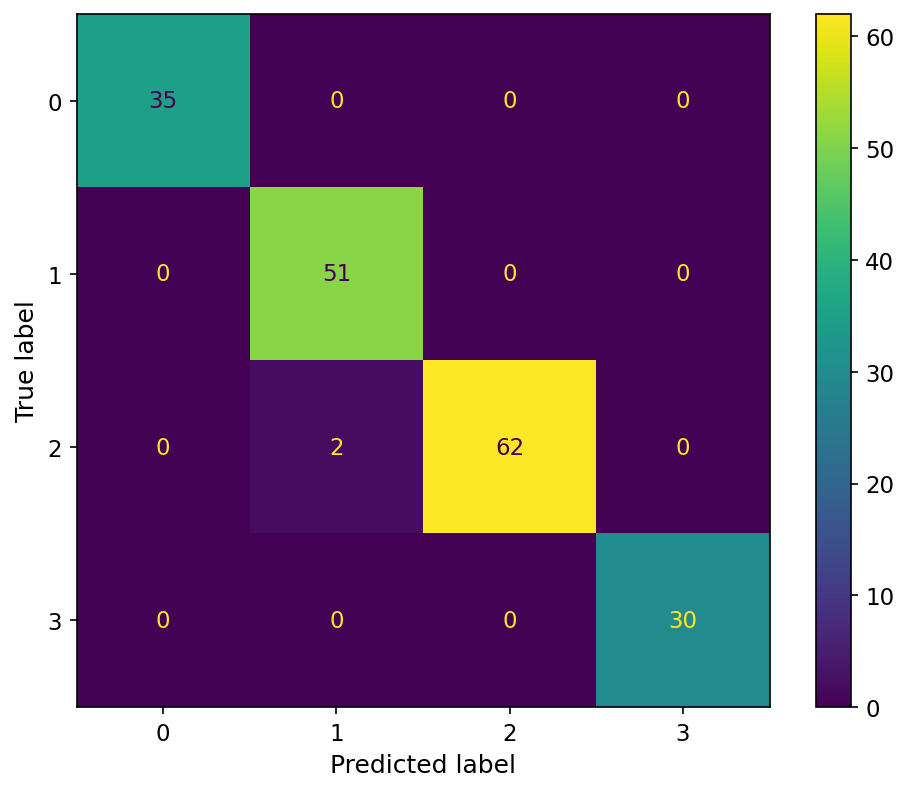


Feature Importance
           Feature  Importance
   Skeleton Length      0.1734
      Vein Density      0.1726
      Connectivity      0.1347
         Junctions      0.0957
         Endpoints      0.0909
  Endpoint Density      0.0865
  Junction Density      0.0808
     Vein Coverage      0.0687
    Segmented Area      0.0598
Skeleton Reduction      0.0369
        Image Area      0.0000


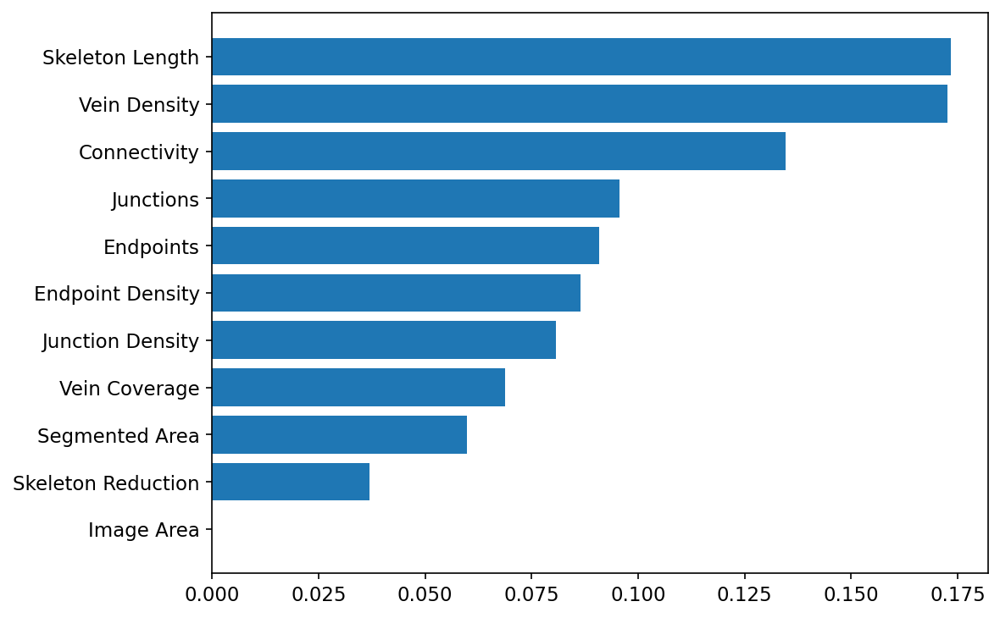


Cross Validation
 Fold  Accuracy
    1    0.9556
    2    0.9722
    3    0.9500
    4    0.9611
    5    0.9611

Mean Accuracy : 0.9600

----------------------------------------------------------------------
Phase 11 completed in 3.176 sec.
----------------------------------------------------------------------


In [ ]:
# ==========================================================
# PHASE 11
# Random Forest Validation
# ==========================================================

start_time = time.time()

print_header("Phase 11 - Random Forest Validation")

from sklearn.model_selection import (
    train_test_split,
    cross_val_score
)

from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import (

    accuracy_score,

    classification_report,

    ConfusionMatrixDisplay

)

# ----------------------------------------------------------
# Prepare Data
# ----------------------------------------------------------

X = dataset_df.drop(

    columns=["Image","Cluster"]

)

y = dataset_df["Cluster"]

X_train, X_test, y_train, y_test = train_test_split(

    X,

    y,

    test_size=0.2,

    random_state=RANDOM_STATE

)

# ----------------------------------------------------------
# Train
# ----------------------------------------------------------

rf = RandomForestClassifier(

    random_state=RANDOM_STATE

)

rf.fit(

    X_train,

    y_train

)

predictions = rf.predict(

    X_test

)

accuracy = accuracy_score(

    y_test,

    predictions

)

print(f"\nAccuracy : {accuracy:.4f}")

print("\nClassification Report\n")

print(

    classification_report(

        y_test,

        predictions

    )

)

# ----------------------------------------------------------
# Confusion Matrix
# ----------------------------------------------------------

ConfusionMatrixDisplay.from_estimator(

    rf,

    X_test,

    y_test

)

save_figure(
    "figure_17_confusion_matrix.png"
)

plt.show()

# ----------------------------------------------------------
# Feature Importance
# ----------------------------------------------------------

importance = pd.DataFrame({

    "Feature": X.columns,

    "Importance": rf.feature_importances_

}).sort_values(

    "Importance",

    ascending=False

)

display_dataframe(

    importance.round(4),

    "Feature Importance"

)

save_table(

    importance,

    "table_17_feature_importance.csv"

)

plt.figure(figsize=(8,5))

plt.barh(

    importance["Feature"],

    importance["Importance"]

)

plt.gca().invert_yaxis()

plt.tight_layout()

save_figure(
    "figure_18_feature_importance.png"
)

plt.show()

# ----------------------------------------------------------
# Cross Validation
# ----------------------------------------------------------

scores = cross_val_score(

    rf,

    X,

    y,

    cv=5

)

cv_table = pd.DataFrame({

    "Fold":

        np.arange(1,6),

    "Accuracy":

        scores.round(4)

})

display_dataframe(

    cv_table,

    "Cross Validation"

)

save_table(

    cv_table,

    "table_18_cross_validation.csv"

)

print(f"\nMean Accuracy : {scores.mean():.4f}")

print_footer(

    f"Phase 11 completed in {execution_time(start_time)} sec."

)

# Project Summary

## Overview

This project developed a complete classical machine vision pipeline for automated leaf vein extraction and quantitative analysis from grayscale leaf images. The proposed framework integrates image preprocessing, enhancement, segmentation, skeletonization, handcrafted feature extraction, statistical analysis, dimensionality reduction, clustering, and supervised machine learning validation.

The complete pipeline was evaluated using the **CHAMBASA Leaf Dataset** consisting of **900 leaf images**.

---

## Completed Pipeline

- Image Standardization
- Noise Reduction
- Contrast Enhancement
- Leaf Vein Segmentation
- Morphological Refinement
- Skeletonization
- Vein Network Analysis
- Feature Extraction
- Batch Dataset Processing
- Statistical Analysis
- Principal Component Analysis
- K-Means Clustering
- Random Forest Classification

---

## Project Outputs

The project automatically generated:

- Publication-quality figures
- Quantitative feature tables
- Processed images
- Statistical summaries
- PCA visualizations
- Clustering results
- Random Forest evaluation

All outputs are organized within the **Results** directory for easy reference during report preparation.

---

## Conclusion

The developed pipeline successfully extracted meaningful structural features from leaf vein images and demonstrated that handcrafted computer vision techniques remain highly effective for interpretable biological image analysis and feature-based machine learning.

In [ ]:
# ==========================================================
# FINAL PROJECT SUMMARY
# ==========================================================

start_time = time.time()

print_header("Industrial Machine Vision Project Summary")

# ----------------------------------------------------------
# Project Summary
# ----------------------------------------------------------

summary = pd.DataFrame({

    "Category":[

        "Dataset",

        "Images Processed",

        "Pipeline Phases",

        "Features Extracted",

        "Machine Learning",

        "Cross Validation",

        "Results Directory"

    ],

    "Value":[

        "CHAMBASA Leaf Dataset",

        len(dataset_df),

        11,

        len(feature_names),

        "Random Forest",

        "5-Fold",

        RESULTS_DIR

    ]

})

display_dataframe(
    summary,
    "Project Overview"
)

save_table(
    summary,
    "table_19_project_summary.csv"
)

# ----------------------------------------------------------
# Generated Outputs
# ----------------------------------------------------------

figure_count = len(list(Path(FIGURES_DIR).glob("*")))

table_count = len(list(Path(TABLES_DIR).glob("*")))

image_count = len(list(Path(IMAGES_DIR).glob("*")))

output_summary = pd.DataFrame({

    "Output":[

        "Figures",

        "Tables",

        "Processed Images"

    ],

    "Generated":[

        figure_count,

        table_count,

        image_count

    ]

})

display_dataframe(
    output_summary,
    "Generated Outputs"
)

save_table(
    output_summary,
    "table_20_output_summary.csv"
)

# ----------------------------------------------------------
# Final Message
# ----------------------------------------------------------

print("\n" + "="*70)
print("PROJECT COMPLETED SUCCESSFULLY")
print("="*70)

print("\nThe complete machine vision pipeline has been executed successfully.")

print(f"\nDataset Processed      : {len(dataset_df)} images")
print(f"Figures Generated      : {figure_count}")
print(f"Tables Generated       : {table_count}")
print(f"Processed Images Saved : {image_count}")

print("\nAll project outputs have been organized within the Results directory.")

print("\nThank you for using this leaf vein analysis framework!")

print_footer(
    f"Notebook completed in {execution_time(start_time)} sec."
)


INDUSTRIAL MACHINE VISION PROJECT SUMMARY

Project Overview
          Category                                            Value
           Dataset                            CHAMBASA Leaf Dataset
  Images Processed                                              900
   Pipeline Phases                                               11
Features Extracted                                               11
  Machine Learning                                    Random Forest
  Cross Validation                                           5-Fold
 Results Directory /content/drive/MyDrive/ENGI 9804_Project/Results

Generated Outputs
          Output  Generated
         Figures         19
          Tables         21
Processed Images         20

PROJECT COMPLETED SUCCESSFULLY

The complete machine vision pipeline has been executed successfully.

Dataset Processed      : 900 images
Figures Generated      : 19
Tables Generated       : 21
Processed Images Saved : 20

All project outputs have been organized 